In [1]:
import scanpy as sc
import multimil as mtm
import anndata as ad
import numpy as np
import scib
import matplotlib.pyplot as plt 

sc.set_figure_params(dpi=100, frameon=False, facecolor=None, transparent=True)

[rank: 0] Global seed set to 0
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [2]:
%load_ext autoreload
%autoreload 2

## Disease prediction on both SUN and SEAAD

### MultiMIL without single atac

In [87]:
adata = sc.read_h5ad('/home/icb/zihe.zheng/projects/microglia/data/integrated_all_5000atac_no_single_atac.h5ad')

In [88]:
sc.pp.neighbors(adata, use_rep="X_multiMIL")
sc.tl.umap(adata)

In [89]:
adata.obs['AD'] = np.where(
    (adata.obs['ADdiag3types'] == 'nonAD') | (adata.obs['Overall AD neuropathological Change'].isin(['Not AD', 'Reference'])),
    'healthy',  # Value if condition is True
    'AD'  # Value if condition is False, adjust this as necessary
)

In [90]:
# Ensure both categorical columns have the same categories
combined_categories = adata.obs['Donor ID'].cat.categories.union(adata.obs['subject'].cat.categories)

# Set the combined categories for both columns
adata.obs['Donor ID'] = adata.obs['Donor ID'].cat.set_categories(combined_categories)
adata.obs['subject'] = adata.obs['subject'].cat.set_categories(combined_categories)

# Fill NaN values in 'Brain Region' with values from 'brainRegion'
# adata.obs['Donor ID'] = adata.obs['Donor ID'].replace('nan', np.nan)  # Ensure real NaN values
# adata.obs['Donor ID'] = adata.obs['Donor ID'].fillna(adata.obs['subject'])
adata.obs['Donor ID'] = adata.obs['Donor ID'].mask(adata.obs['Donor ID'] == 'nan', adata.obs['subject'])


In [91]:
new_adata = ad.AnnData(X=adata.obsm['X_multiMIL'])
new_adata.obs = adata.obs.copy()
new_adata.obsm = adata.obsm.copy()

(array([360.,  39.,  34.,  33.,  19.,  15.,  10.,   0.,   2.,   3.]),
 array([   0. ,  344.9,  689.8, 1034.7, 1379.6, 1724.5, 2069.4, 2414.3,
        2759.2, 3104.1, 3449. ]),
 <BarContainer object of 10 artists>)

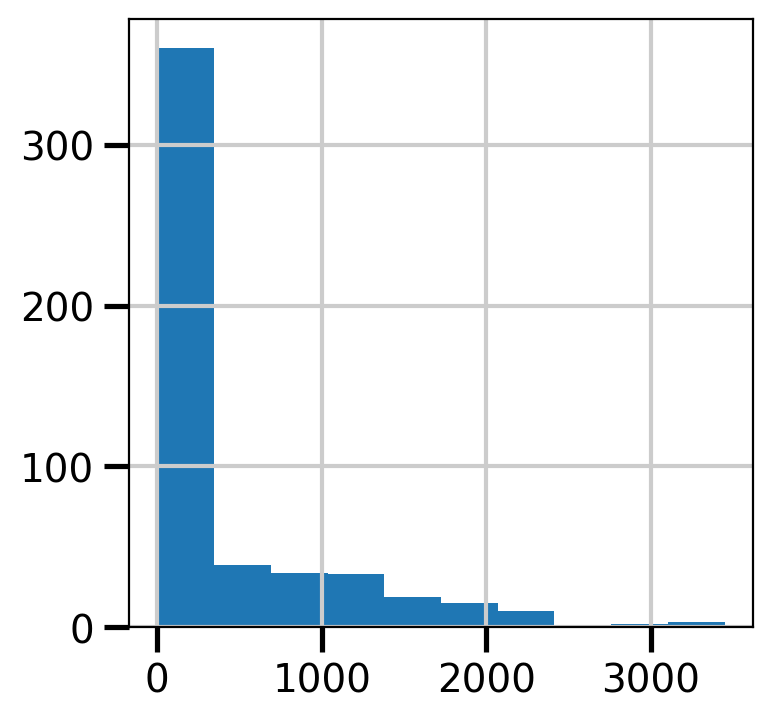

In [85]:
# number of cells per donor varies a lot
import matplotlib.pyplot as plt
plt.hist(adata.obs['Donor ID'].value_counts())

In [92]:
mask = adata.obs['Donor ID'].value_counts() > 100
samples = list(mask[mask].index)

In [93]:
sample_key = 'Donor ID'

In [94]:
# samples = np.unique(adata.obs[sample_key])
n_samples = len(samples)
query_proportion = 0.2

In [95]:
rng = np.random.default_rng(0)
query_samples = rng.choice(samples, int(n_samples * query_proportion), replace=False)

In [96]:
np.save('query_samples.npy', query_samples)

In [97]:
query = new_adata[new_adata.obs[sample_key].isin(query_samples)].copy()
adata = new_adata[~new_adata.obs[sample_key].isin(query_samples)].copy()

query.obs["ref"] = "query"
adata.obs["ref"] = "reference"

In [98]:
classification_keys = ["AD"]
z_dim = 16
sample_key = 'Donor ID'
categorical_covariate_keys = classification_keys + [sample_key]

In [99]:
idx = adata.obs[sample_key].sort_values().index
adata = adata[idx].copy()

idx = query.obs[sample_key].sort_values().index
query = query[idx].copy()

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


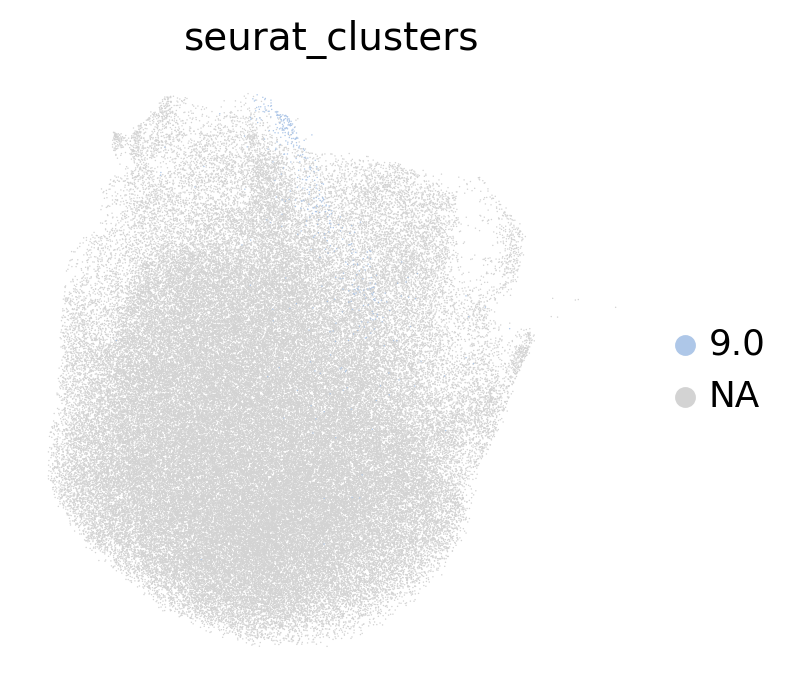

In [108]:
adata_sun = adata[adata.obs['seurat_clusters']!='nan']
sc.pl.umap(adata_sun, color = 'seurat_clusters', groups = ['9.0'])

In [109]:
adata_sun.obs.seurat_clusters.value_counts()

seurat_clusters
0.0     29673
2.0     21616
1.0     18684
4.0     10261
3.0      9630
5.0      8016
6.0      5830
7.0      2896
8.0      2425
10.0     1712
12.0     1671
11.0     1058
9.0       447
Name: count, dtype: int64

In [94]:
mtm.model.MILClassifier.setup_anndata(
    adata,
    categorical_covariate_keys=categorical_covariate_keys,
)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/_utils.py:172: UserWarning: Category 0 in adata.obs['Donor ID'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(


In [95]:
mil = mtm.model.MILClassifier(
    adata,
    classification=classification_keys,
    z_dim=z_dim,
    sample_key=sample_key,
    class_loss_coef=0.1,
)

In [96]:
mil.train(lr=1e-4, train_size = 0.8)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
You are using a CUDA device ('NVIDIA A100 80

Epoch 1/200:   0%|▏                                              | 1/200 [00:08<26:39,  8.04s/it, loss=0.0763, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 3/200:   1%|▍                                              | 2/200 [00:11<17:01,  5.16s/it, loss=0.0706, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 4/200:   2%|▋                                              | 3/200 [00:14<13:27,  4.10s/it, loss=0.0703, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 5/200:   2%|▉                                              | 4/200 [00:16<11:47,  3.61s/it, loss=0.0557, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 6/200:   2%|█▏                                             | 5/200 [00:19<10:50,  3.33s/it, loss=0.0618, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 7/200:   3%|█▍                                             | 6/200 [00:22<10:13,  3.16s/it, loss=0.0583, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 8/200:   4%|█▋                                             | 7/200 [00:25<09:50,  3.06s/it, loss=0.0575, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 9/200:   4%|█▉                                             | 8/200 [00:28<09:33,  2.98s/it, loss=0.0633, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 10/200:   4%|██                                            | 9/200 [00:31<09:21,  2.94s/it, loss=0.0638, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 11/200:   5%|██▎                                          | 10/200 [00:33<09:12,  2.91s/it, loss=0.0586, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 12/200:   6%|██▍                                          | 11/200 [00:36<09:06,  2.89s/it, loss=0.0629, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 13/200:   6%|██▋                                          | 12/200 [00:39<09:00,  2.88s/it, loss=0.0485, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 14/200:   6%|██▉                                          | 13/200 [00:42<08:56,  2.87s/it, loss=0.0503, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 15/200:   7%|███▏                                         | 14/200 [00:45<08:51,  2.86s/it, loss=0.0592, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 16/200:   8%|███▍                                         | 15/200 [00:48<08:47,  2.85s/it, loss=0.0404, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 17/200:   8%|███▌                                         | 16/200 [00:50<08:44,  2.85s/it, loss=0.0526, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 18/200:   8%|███▊                                         | 17/200 [00:53<08:41,  2.85s/it, loss=0.0447, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 19/200:   9%|████                                         | 18/200 [00:56<08:37,  2.85s/it, loss=0.0409, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 20/200:  10%|████▎                                        | 19/200 [00:59<08:36,  2.85s/it, loss=0.0544, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 21/200:  10%|████▌                                        | 20/200 [01:02<08:34,  2.86s/it, loss=0.0541, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 22/200:  10%|████▋                                        | 21/200 [01:05<08:31,  2.85s/it, loss=0.0516, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 23/200:  11%|████▉                                        | 22/200 [01:08<08:27,  2.85s/it, loss=0.0568, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 24/200:  12%|█████▏                                       | 23/200 [01:10<08:25,  2.85s/it, loss=0.0465, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 25/200:  12%|█████▍                                       | 24/200 [01:13<08:22,  2.86s/it, loss=0.0438, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 26/200:  12%|█████▋                                       | 25/200 [01:16<08:19,  2.86s/it, loss=0.0441, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 27/200:  13%|█████▊                                       | 26/200 [01:19<08:17,  2.86s/it, loss=0.0468, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 28/200:  14%|██████                                       | 27/200 [01:22<08:13,  2.85s/it, loss=0.0425, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 29/200:  14%|██████▎                                      | 28/200 [01:25<08:11,  2.86s/it, loss=0.0653, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 30/200:  14%|██████▌                                      | 29/200 [01:28<08:07,  2.85s/it, loss=0.0425, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 31/200:  15%|██████▊                                      | 30/200 [01:30<08:04,  2.85s/it, loss=0.0329, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 32/200:  16%|██████▉                                      | 31/200 [01:33<08:01,  2.85s/it, loss=0.0373, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 33/200:  16%|███████▏                                     | 32/200 [01:36<07:58,  2.85s/it, loss=0.0363, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 34/200:  16%|███████▌                                      | 33/200 [01:39<07:56,  2.85s/it, loss=0.041, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 35/200:  17%|███████▋                                     | 34/200 [01:42<07:53,  2.85s/it, loss=0.0441, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 36/200:  18%|███████▊                                     | 35/200 [01:45<07:50,  2.85s/it, loss=0.0412, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 37/200:  18%|████████                                     | 36/200 [01:48<07:48,  2.85s/it, loss=0.0428, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 38/200:  18%|████████▎                                    | 37/200 [01:50<07:46,  2.86s/it, loss=0.0391, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 39/200:  19%|████████▌                                    | 38/200 [01:53<07:44,  2.86s/it, loss=0.0468, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 40/200:  20%|████████▉                                     | 39/200 [01:56<07:40,  2.86s/it, loss=0.053, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 41/200:  20%|█████████▏                                    | 40/200 [01:59<07:39,  2.87s/it, loss=0.049, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 42/200:  20%|█████████▏                                   | 41/200 [02:02<07:35,  2.87s/it, loss=0.0381, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 43/200:  21%|█████████▍                                   | 42/200 [02:05<07:32,  2.87s/it, loss=0.0391, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 44/200:  22%|█████████▋                                   | 43/200 [02:08<07:31,  2.88s/it, loss=0.0263, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 45/200:  22%|██████████                                    | 44/200 [02:11<07:33,  2.91s/it, loss=0.031, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 46/200:  22%|██████████▏                                  | 45/200 [02:14<07:28,  2.89s/it, loss=0.0463, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 47/200:  23%|██████████▎                                  | 46/200 [02:16<07:23,  2.88s/it, loss=0.0444, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 48/200:  24%|██████████▌                                  | 47/200 [02:19<07:19,  2.87s/it, loss=0.0466, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 49/200:  24%|██████████▊                                  | 48/200 [02:22<07:15,  2.86s/it, loss=0.0386, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 50/200:  24%|███████████                                  | 49/200 [02:25<07:12,  2.86s/it, loss=0.0455, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 51/200:  25%|███████████▎                                 | 50/200 [02:28<07:09,  2.86s/it, loss=0.0307, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 52/200:  26%|███████████▍                                 | 51/200 [02:31<07:05,  2.86s/it, loss=0.0263, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 53/200:  26%|███████████▋                                 | 52/200 [02:33<07:02,  2.85s/it, loss=0.0348, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 54/200:  26%|███████████▉                                 | 53/200 [02:36<06:59,  2.85s/it, loss=0.0363, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 55/200:  27%|████████████▏                                | 54/200 [02:39<06:55,  2.85s/it, loss=0.0381, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 56/200:  28%|████████████▍                                | 55/200 [02:42<06:54,  2.86s/it, loss=0.0324, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 57/200:  28%|████████████▌                                | 56/200 [02:45<06:51,  2.86s/it, loss=0.0359, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 58/200:  28%|████████████▊                                | 57/200 [02:48<06:48,  2.85s/it, loss=0.0271, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 59/200:  29%|█████████████                                | 58/200 [02:51<06:45,  2.85s/it, loss=0.0304, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 60/200:  30%|█████████████▎                               | 59/200 [02:53<06:41,  2.85s/it, loss=0.0292, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 61/200:  30%|█████████████▌                               | 60/200 [02:56<06:37,  2.84s/it, loss=0.0357, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 62/200:  30%|█████████████▋                               | 61/200 [02:59<06:37,  2.86s/it, loss=0.0234, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 63/200:  31%|█████████████▉                               | 62/200 [03:02<06:35,  2.86s/it, loss=0.0321, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 64/200:  32%|██████████████▏                              | 63/200 [03:05<06:30,  2.85s/it, loss=0.0359, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 65/200:  32%|██████████████▋                               | 64/200 [03:08<06:27,  2.85s/it, loss=0.024, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 66/200:  32%|██████████████▋                              | 65/200 [03:11<06:24,  2.85s/it, loss=0.0348, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 67/200:  33%|██████████████▊                              | 66/200 [03:13<06:21,  2.84s/it, loss=0.0369, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 68/200:  34%|███████████████                              | 67/200 [03:16<06:18,  2.85s/it, loss=0.0255, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 69/200:  34%|███████████████▎                             | 68/200 [03:19<06:15,  2.85s/it, loss=0.0377, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 70/200:  34%|███████████████▌                             | 69/200 [03:22<06:12,  2.85s/it, loss=0.0269, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 71/200:  35%|███████████████▋                             | 70/200 [03:25<06:10,  2.85s/it, loss=0.0427, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 72/200:  36%|███████████████▉                             | 71/200 [03:28<06:07,  2.85s/it, loss=0.0458, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 73/200:  36%|████████████████▏                            | 72/200 [03:30<06:05,  2.85s/it, loss=0.0321, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 74/200:  36%|████████████████▍                            | 73/200 [03:33<06:01,  2.85s/it, loss=0.0279, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 75/200:  37%|████████████████▋                            | 74/200 [03:36<05:58,  2.85s/it, loss=0.0336, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 76/200:  38%|████████████████▉                            | 75/200 [03:39<05:55,  2.84s/it, loss=0.0435, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 77/200:  38%|█████████████████                            | 76/200 [03:42<05:52,  2.85s/it, loss=0.0308, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 78/200:  38%|█████████████████▎                           | 77/200 [03:45<05:50,  2.85s/it, loss=0.0412, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 79/200:  39%|█████████████████▌                           | 78/200 [03:48<05:47,  2.85s/it, loss=0.0366, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 80/200:  40%|█████████████████▊                           | 79/200 [03:50<05:44,  2.85s/it, loss=0.0274, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 81/200:  40%|██████████████████                           | 80/200 [03:53<05:41,  2.84s/it, loss=0.0254, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 82/200:  40%|██████████████████▏                          | 81/200 [03:56<05:37,  2.84s/it, loss=0.0344, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 83/200:  41%|██████████████████▍                          | 82/200 [03:59<05:34,  2.84s/it, loss=0.0323, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 84/200:  42%|██████████████████▋                          | 83/200 [04:02<05:31,  2.84s/it, loss=0.0307, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 85/200:  42%|██████████████████▉                          | 84/200 [04:05<05:29,  2.84s/it, loss=0.0221, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 86/200:  42%|███████████████████▏                         | 85/200 [04:07<05:26,  2.84s/it, loss=0.0345, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 87/200:  43%|███████████████████▎                         | 86/200 [04:10<05:24,  2.84s/it, loss=0.0242, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 88/200:  44%|███████████████████▌                         | 87/200 [04:13<05:21,  2.85s/it, loss=0.0351, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 89/200:  44%|███████████████████▊                         | 88/200 [04:16<05:18,  2.85s/it, loss=0.0332, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 90/200:  44%|████████████████████                         | 89/200 [04:19<05:16,  2.85s/it, loss=0.0238, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 91/200:  45%|████████████████████▎                        | 90/200 [04:22<05:13,  2.85s/it, loss=0.0268, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 92/200:  46%|████████████████████▍                        | 91/200 [04:25<05:10,  2.85s/it, loss=0.0211, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 93/200:  46%|████████████████████▋                        | 92/200 [04:27<05:07,  2.84s/it, loss=0.0276, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 94/200:  46%|████████████████████▉                        | 93/200 [04:30<05:04,  2.85s/it, loss=0.0194, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 95/200:  47%|█████████████████████▏                       | 94/200 [04:33<05:02,  2.85s/it, loss=0.0173, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 96/200:  48%|█████████████████████▊                        | 95/200 [04:36<04:59,  2.85s/it, loss=0.019, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 97/200:  48%|█████████████████████▌                       | 96/200 [04:39<04:56,  2.85s/it, loss=0.0311, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 98/200:  48%|█████████████████████▊                       | 97/200 [04:42<04:53,  2.85s/it, loss=0.0275, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 99/200:  49%|██████████████████████                       | 98/200 [04:44<04:50,  2.85s/it, loss=0.0152, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 100/200:  50%|█████████████████████▊                      | 99/200 [04:47<04:47,  2.85s/it, loss=0.0171, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 101/200:  50%|█████████████████████▌                     | 100/200 [04:50<04:44,  2.85s/it, loss=0.0328, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 102/200:  50%|█████████████████████▋                     | 101/200 [04:53<04:42,  2.86s/it, loss=0.0148, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 103/200:  51%|█████████████████████▉                     | 102/200 [04:56<04:39,  2.85s/it, loss=0.0348, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 104/200:  52%|██████████████████████▏                    | 103/200 [04:59<04:36,  2.85s/it, loss=0.0284, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 105/200:  52%|██████████████████████▎                    | 104/200 [05:02<04:33,  2.85s/it, loss=0.0251, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 106/200:  52%|██████████████████████▌                    | 105/200 [05:05<04:35,  2.90s/it, loss=0.0179, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 107/200:  53%|██████████████████████▊                    | 106/200 [05:07<04:31,  2.89s/it, loss=0.0222, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 108/200:  54%|███████████████████████                    | 107/200 [05:10<04:28,  2.88s/it, loss=0.0277, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 109/200:  54%|███████████████████████▏                   | 108/200 [05:14<04:49,  3.14s/it, loss=0.0312, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 110/200:  55%|███████████████████████▍                   | 109/200 [05:17<04:38,  3.06s/it, loss=0.0399, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 111/200:  55%|███████████████████████▋                   | 110/200 [05:20<04:29,  3.00s/it, loss=0.0294, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 112/200:  56%|███████████████████████▊                   | 111/200 [05:23<04:22,  2.95s/it, loss=0.0256, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 113/200:  56%|████████████████████████▋                   | 112/200 [05:25<04:17,  2.92s/it, loss=0.018, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 114/200:  56%|████████████████████████▎                  | 113/200 [05:28<04:11,  2.89s/it, loss=0.0354, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 115/200:  57%|████████████████████████▌                  | 114/200 [05:31<04:07,  2.88s/it, loss=0.0279, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 116/200:  57%|█████████████████████████▎                  | 115/200 [05:34<04:03,  2.87s/it, loss=0.016, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 117/200:  58%|████████████████████████▉                  | 116/200 [05:37<04:00,  2.86s/it, loss=0.0245, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 118/200:  58%|█████████████████████████▏                 | 117/200 [05:40<03:56,  2.85s/it, loss=0.0191, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 119/200:  59%|█████████████████████████▎                 | 118/200 [05:42<03:53,  2.85s/it, loss=0.0246, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 120/200:  60%|█████████████████████████▌                 | 119/200 [05:45<03:50,  2.85s/it, loss=0.0261, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 121/200:  60%|█████████████████████████▊                 | 120/200 [05:48<03:47,  2.85s/it, loss=0.0203, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 122/200:  60%|██████████████████████████                 | 121/200 [05:51<03:45,  2.85s/it, loss=0.0177, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 123/200:  61%|██████████████████████████▏                | 122/200 [05:54<03:41,  2.84s/it, loss=0.0216, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 124/200:  62%|██████████████████████████▍                | 123/200 [05:57<03:38,  2.84s/it, loss=0.0223, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 125/200:  62%|██████████████████████████▋                | 124/200 [06:00<03:36,  2.84s/it, loss=0.0214, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 126/200:  62%|██████████████████████████▉                | 125/200 [06:02<03:33,  2.84s/it, loss=0.0284, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 127/200:  63%|███████████████████████████                | 126/200 [06:05<03:30,  2.84s/it, loss=0.0253, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 128/200:  64%|███████████████████████████▉                | 127/200 [06:08<03:27,  2.84s/it, loss=0.021, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 129/200:  64%|███████████████████████████▌               | 128/200 [06:11<03:24,  2.84s/it, loss=0.0134, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 130/200:  64%|███████████████████████████▋               | 129/200 [06:14<03:21,  2.84s/it, loss=0.0241, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 131/200:  65%|███████████████████████████▉               | 130/200 [06:17<03:19,  2.85s/it, loss=0.0276, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 132/200:  66%|████████████████████████████▏              | 131/200 [06:19<03:16,  2.84s/it, loss=0.0304, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 133/200:  66%|████████████████████████████▍              | 132/200 [06:22<03:13,  2.84s/it, loss=0.0249, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 134/200:  66%|████████████████████████████▌              | 133/200 [06:25<03:10,  2.84s/it, loss=0.0289, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 135/200:  67%|████████████████████████████▊              | 134/200 [06:28<03:07,  2.84s/it, loss=0.0284, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 136/200:  68%|█████████████████████████████              | 135/200 [06:31<03:05,  2.85s/it, loss=0.0158, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 137/200:  68%|█████████████████████████████▏             | 136/200 [06:34<03:02,  2.85s/it, loss=0.0105, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 138/200:  68%|█████████████████████████████▍             | 137/200 [06:37<02:59,  2.85s/it, loss=0.0277, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 139/200:  69%|█████████████████████████████▋             | 138/200 [06:39<02:56,  2.85s/it, loss=0.0158, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 140/200:  70%|█████████████████████████████▉             | 139/200 [06:42<02:54,  2.86s/it, loss=0.0204, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 141/200:  70%|██████████████████████████████             | 140/200 [06:45<02:51,  2.85s/it, loss=0.0171, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 142/200:  70%|██████████████████████████████▎            | 141/200 [06:48<02:48,  2.85s/it, loss=0.0207, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 143/200:  71%|██████████████████████████████▌            | 142/200 [06:51<02:45,  2.86s/it, loss=0.0276, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 144/200:  72%|██████████████████████████████▋            | 143/200 [06:54<02:42,  2.85s/it, loss=0.0268, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 145/200:  72%|██████████████████████████████▉            | 144/200 [06:57<02:39,  2.85s/it, loss=0.0165, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 146/200:  72%|███████████████████████████████▏           | 145/200 [06:59<02:36,  2.85s/it, loss=0.0166, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 147/200:  73%|███████████████████████████████▍           | 146/200 [07:02<02:33,  2.85s/it, loss=0.0339, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 148/200:  74%|███████████████████████████████▌           | 147/200 [07:05<02:31,  2.85s/it, loss=0.0138, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 149/200:  74%|███████████████████████████████▊           | 148/200 [07:08<02:28,  2.85s/it, loss=0.0204, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 150/200:  74%|████████████████████████████████           | 149/200 [07:11<02:25,  2.85s/it, loss=0.0191, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 151/200:  75%|████████████████████████████████▎          | 150/200 [07:14<02:22,  2.85s/it, loss=0.0279, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 152/200:  76%|████████████████████████████████▍          | 151/200 [07:17<02:20,  2.86s/it, loss=0.0139, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 153/200:  76%|████████████████████████████████▋          | 152/200 [07:19<02:17,  2.86s/it, loss=0.0266, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 154/200:  76%|████████████████████████████████▉          | 153/200 [07:22<02:14,  2.86s/it, loss=0.0212, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 155/200:  77%|█████████████████████████████████          | 154/200 [07:25<02:11,  2.86s/it, loss=0.0336, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 156/200:  78%|█████████████████████████████████▎         | 155/200 [07:28<02:08,  2.85s/it, loss=0.0181, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 157/200:  78%|█████████████████████████████████▌         | 156/200 [07:31<02:05,  2.85s/it, loss=0.0261, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 158/200:  78%|█████████████████████████████████▊         | 157/200 [07:34<02:02,  2.85s/it, loss=0.0165, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 159/200:  79%|█████████████████████████████████▉         | 158/200 [07:36<01:59,  2.85s/it, loss=0.0194, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 160/200:  80%|██████████████████████████████████▏        | 159/200 [07:39<01:57,  2.85s/it, loss=0.0379, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 161/200:  80%|██████████████████████████████████▍        | 160/200 [07:42<01:54,  2.85s/it, loss=0.0134, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 162/200:  80%|██████████████████████████████████▌        | 161/200 [07:45<01:51,  2.86s/it, loss=0.0179, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 163/200:  81%|██████████████████████████████████        | 162/200 [07:48<01:48,  2.85s/it, loss=0.00975, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 164/200:  82%|███████████████████████████████████        | 163/200 [07:51<01:45,  2.85s/it, loss=0.0206, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 165/200:  82%|███████████████████████████████████▎       | 164/200 [07:54<01:42,  2.85s/it, loss=0.0276, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 166/200:  82%|███████████████████████████████████▍       | 165/200 [07:56<01:39,  2.85s/it, loss=0.0243, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 167/200:  83%|███████████████████████████████████▋       | 166/200 [07:59<01:37,  2.85s/it, loss=0.0182, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 168/200:  84%|███████████████████████████████████▉       | 167/200 [08:02<01:33,  2.85s/it, loss=0.0258, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 169/200:  84%|████████████████████████████████████       | 168/200 [08:05<01:30,  2.84s/it, loss=0.0149, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 170/200:  84%|████████████████████████████████████▎      | 169/200 [08:08<01:28,  2.84s/it, loss=0.0172, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 171/200:  85%|████████████████████████████████████▌      | 170/200 [08:11<01:25,  2.85s/it, loss=0.0165, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 172/200:  86%|████████████████████████████████████▊      | 171/200 [08:14<01:22,  2.84s/it, loss=0.0122, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 173/200:  86%|████████████████████████████████████▉      | 172/200 [08:16<01:19,  2.85s/it, loss=0.0148, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 174/200:  86%|█████████████████████████████████████▏     | 173/200 [08:19<01:16,  2.85s/it, loss=0.0151, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 175/200:  87%|█████████████████████████████████████▍     | 174/200 [08:22<01:14,  2.85s/it, loss=0.0233, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 176/200:  88%|█████████████████████████████████████▋     | 175/200 [08:25<01:11,  2.85s/it, loss=0.0106, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 177/200:  88%|█████████████████████████████████████▊     | 176/200 [08:28<01:08,  2.84s/it, loss=0.0334, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 178/200:  88%|██████████████████████████████████████     | 177/200 [08:31<01:05,  2.85s/it, loss=0.0203, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 179/200:  89%|█████████████████████████████████████▍    | 178/200 [08:33<01:02,  2.85s/it, loss=0.00779, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 180/200:  90%|███████████████████████████████████████▍    | 179/200 [08:36<00:59,  2.85s/it, loss=0.011, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 181/200:  90%|██████████████████████████████████████▋    | 180/200 [08:39<00:56,  2.85s/it, loss=0.0118, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 182/200:  90%|██████████████████████████████████████▉    | 181/200 [08:42<00:54,  2.85s/it, loss=0.0373, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 183/200:  91%|███████████████████████████████████████▏   | 182/200 [08:45<00:51,  2.85s/it, loss=0.0209, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 184/200:  92%|███████████████████████████████████████▎   | 183/200 [08:48<00:48,  2.85s/it, loss=0.0315, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 185/200:  92%|███████████████████████████████████████▌   | 184/200 [08:51<00:45,  2.85s/it, loss=0.0123, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 186/200:  92%|████████████████████████████████████████▋   | 185/200 [08:54<00:43,  2.89s/it, loss=0.023, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 187/200:  93%|███████████████████████████████████████▉   | 186/200 [08:56<00:40,  2.87s/it, loss=0.0259, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 188/200:  94%|████████████████████████████████████████▏  | 187/200 [08:59<00:37,  2.86s/it, loss=0.0147, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 189/200:  94%|████████████████████████████████████████▍  | 188/200 [09:02<00:34,  2.86s/it, loss=0.0132, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 190/200:  94%|█████████████████████████████████████████▌  | 189/200 [09:05<00:31,  2.85s/it, loss=0.017, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 191/200:  95%|████████████████████████████████████████▊  | 190/200 [09:08<00:28,  2.85s/it, loss=0.0135, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 192/200:  96%|█████████████████████████████████████████  | 191/200 [09:11<00:25,  2.85s/it, loss=0.0259, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 193/200:  96%|████████████████████████████████████████▎ | 192/200 [09:13<00:22,  2.85s/it, loss=0.00955, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 194/200:  96%|█████████████████████████████████████████▍ | 193/200 [09:16<00:19,  2.85s/it, loss=0.0187, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 195/200:  97%|█████████████████████████████████████████▋ | 194/200 [09:19<00:17,  2.85s/it, loss=0.0178, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 196/200:  98%|█████████████████████████████████████████▉ | 195/200 [09:22<00:14,  2.85s/it, loss=0.0271, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 197/200:  98%|███████████████████████████████████████████ | 196/200 [09:25<00:11,  2.85s/it, loss=0.006, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 198/200:  98%|██████████████████████████████████████████▎| 197/200 [09:28<00:08,  2.85s/it, loss=0.0161, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 199/200:  99%|██████████████████████████████████████████▌| 198/200 [09:31<00:05,  2.85s/it, loss=0.0196, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 200/200: 100%|██████████████████████████████████████████▊| 199/200 [09:33<00:02,  2.84s/it, loss=0.0258, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 200/200: 100%|███████████████████████████████████████████| 200/200 [09:36<00:00,  2.85s/it, loss=0.0232, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|███████████████████████████████████████████| 200/200 [09:36<00:00,  2.88s/it, loss=0.0232, v_num=1]


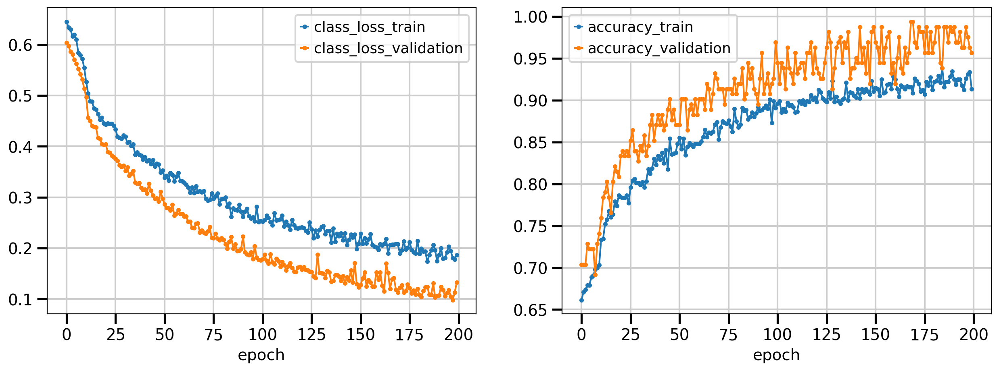

In [97]:
mil.plot_losses()

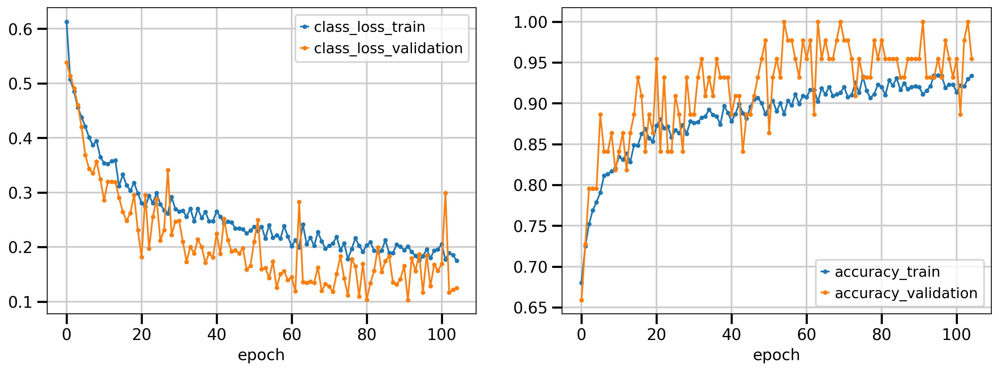

In [21]:
mil.plot_losses()

In [98]:
mil.get_model_output()
# adata

In [99]:
# sc.pl.umap(adata, color=["AD", "predicted_AD", "cell_attn"], ncols=1, frameon=False, vmax="p99")

In [100]:
new_model = mtm.model.MILClassifier.load_query_data(query, mil)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [101]:
new_model.get_model_output()
# query

In [102]:
adata_both = ad.concat([adata, query])

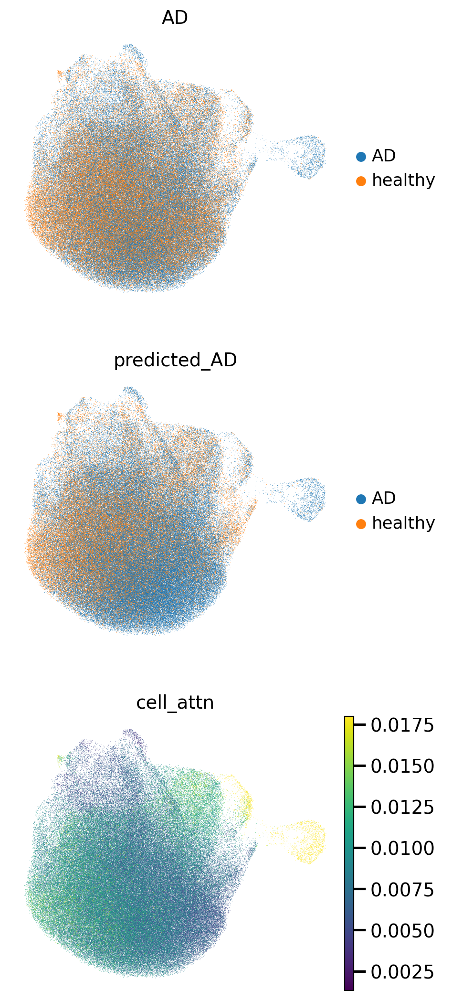

In [103]:
sc.pl.umap(adata_both, color=["AD", "predicted_AD", "cell_attn"], ncols=1, frameon=False, vmax="p99")

In [31]:
from sklearn.metrics import classification_report

print(classification_report(query.obs["AD"], query.obs["predicted_AD"]))

              precision    recall  f1-score   support

          AD       0.50      0.80      0.62     21312
     healthy       0.73      0.40      0.51     28250

    accuracy                           0.57     49562
   macro avg       0.61      0.60      0.56     49562
weighted avg       0.63      0.57      0.56     49562



In [104]:
from sklearn.metrics import classification_report

print(classification_report(query.obs["AD"], query.obs["predicted_AD"]))

              precision    recall  f1-score   support

          AD       0.47      0.83      0.60     21312
     healthy       0.70      0.30      0.42     28250

    accuracy                           0.53     49562
   macro avg       0.59      0.56      0.51     49562
weighted avg       0.60      0.53      0.50     49562



In [106]:
adata_both

AnnData object with n_obs × n_vars = 234945 × 16
    obs: 'sample_id', 'Neurotypical reference', 'Donor ID', 'Organism', 'Brain Region', 'Sex', 'Gender', 'Age at Death', 'Race (choice=White)', 'Race (choice=Black/ African American)', 'Race (choice=Asian)', 'Race (choice=American Indian/ Alaska Native)', 'Race (choice=Native Hawaiian or Pacific Islander)', 'Race (choice=Unknown or unreported)', 'Race (choice=Other)', 'specify other race', 'Hispanic/Latino', 'Highest level of education', 'Years of education', 'PMI', 'Fresh Brain Weight', 'Brain pH', 'Overall AD neuropathological Change', 'Thal', 'Braak', 'CERAD score', 'Overall CAA Score', 'Highest Lewy Body Disease', 'Total Microinfarcts (not observed grossly)', 'Total microinfarcts in screening sections', 'Atherosclerosis', 'Arteriolosclerosis', 'LATE', 'Cognitive Status', 'Last CASI Score', 'Interval from last CASI in months', 'Last MMSE Score', 'Interval from last MMSE in months', 'Last MOCA Score', 'Interval from last MOCA in months

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` an

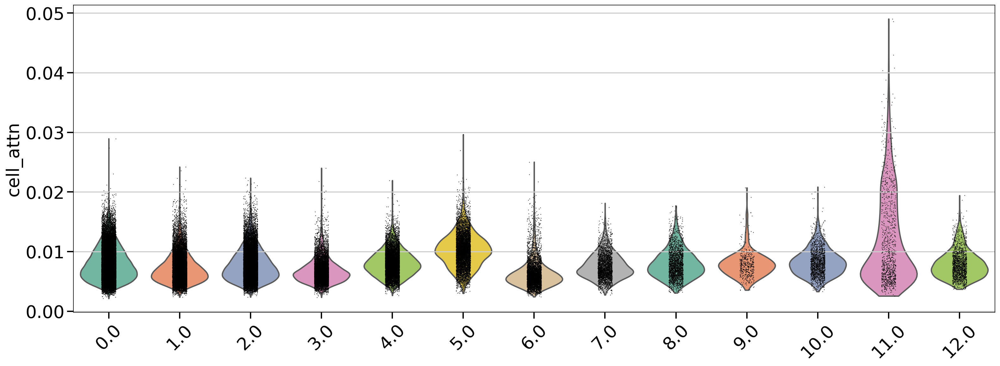

In [114]:
sc.set_figure_params(figsize = (18,8), fontsize = 25)
adata_sun = adata[adata.obs['seurat_clusters']!='nan']
sc.pl.violin(adata_sun, keys = 'cell_attn', palette='Set2', groupby = 'seurat_clusters', rotation = 45)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` an

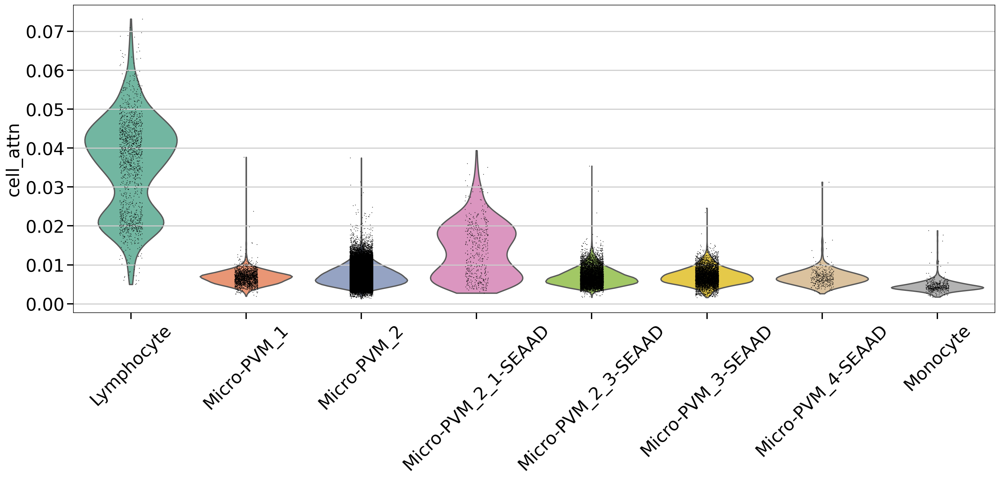

In [112]:
sc.set_figure_params(figsize = (18,8), fontsize = 25)
adata_seaad = adata[adata.obs['Supertype']!='nan']
sc.pl.violin(adata_seaad, keys = 'cell_attn', palette='Set2', groupby = 'Supertype', rotation = 45)

## prediction on SEA-AD dataset

In [3]:
adata = sc.read_h5ad('/home/icb/zihe.zheng/projects/microglia/data/integrated_all_5000atac_no_single_atac.h5ad')

In [4]:
adata_seaad = adata[adata.obs['APOE Genotype']!='nan']

In [5]:
# adata_seaad

In [6]:
sc.pp.neighbors(adata_seaad, use_rep="X_multiMIL")
sc.tl.umap(adata_seaad)

In [7]:
new_adata = ad.AnnData(X=adata_seaad.obsm['X_multiMIL'])
new_adata.obs = adata_seaad.obs.copy()
new_adata.obsm = adata_seaad.obsm.copy()

In [8]:
new_adata.obs['APOE Genotype'].value_counts()

APOE Genotype
3/3    47013
3/4    16302
2/3     9304
4/4     5095
2/4     1728
2/2      650
Name: count, dtype: int64

In [9]:
# add a new obs for two APOEs 
new_adata.obs['APOE4'] = new_adata.obs['APOE Genotype'].isin(['3/4', '4/4', '2/4'])

(array([ 3., 13., 17., 15., 14., 14.,  3.,  2.,  2.,  1.]),
 array([ 210. ,  404.6,  599.2,  793.8,  988.4, 1183. , 1377.6, 1572.2,
        1766.8, 1961.4, 2156. ]),
 <BarContainer object of 10 artists>)

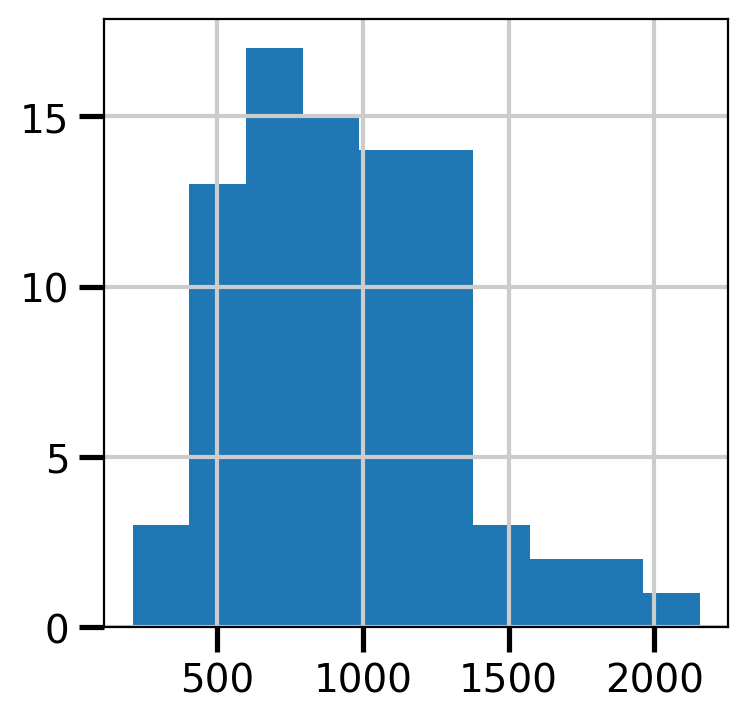

In [10]:
# number of cells per donor varies a lot
import matplotlib.pyplot as plt
plt.hist(adata_seaad.obs['Donor ID'].value_counts())

In [11]:
sample_key = 'Donor ID'

In [12]:
samples = np.unique(adata_seaad.obs[sample_key])
n_samples = len(samples)
query_proportion = 0.2

In [13]:
rng = np.random.default_rng(0)
query_samples = rng.choice(samples, int(n_samples * query_proportion), replace=False)

In [14]:
query = new_adata[new_adata.obs[sample_key].isin(query_samples)].copy()
adata = new_adata[~new_adata.obs[sample_key].isin(query_samples)].copy()

query.obs["ref"] = "query"
adata.obs["ref"] = "reference"

### APOE

In [15]:
classification_keys = ["APOE Genotype"]
z_dim = 16
sample_key = 'Donor ID'
categorical_covariate_keys = classification_keys + [sample_key]

In [16]:
idx = adata.obs[sample_key].sort_values().index
adata = adata[idx].copy()

idx = query.obs[sample_key].sort_values().index
query = query[idx].copy()

In [17]:
mtm.model.MILClassifier.setup_anndata(
    adata,
    categorical_covariate_keys=categorical_covariate_keys,
)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [18]:
mil = mtm.model.MILClassifier(
    adata,
    classification=classification_keys,
    z_dim=z_dim,
    sample_key=sample_key,
    class_loss_coef=0.1,
    regression_loss_coef=0.1,
    
)

In [19]:
mil.train(lr=1e-3)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
You are using a CUDA device ('NVIDIA A100-PC

Epoch 1/200:   0%|                                                                             | 0/200 [00:00<?, ?it/s]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 3/200:   1%|▍                                               | 2/200 [00:21<29:57,  9.08s/it, loss=0.101, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 4/200:   2%|▋                                               | 3/200 [00:23<18:54,  5.76s/it, loss=0.117, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 5/200:   2%|▉                                              | 4/200 [00:24<13:43,  4.20s/it, loss=0.0959, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 6/200:   2%|█▏                                             | 5/200 [00:26<10:33,  3.25s/it, loss=0.0738, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 7/200:   3%|█▍                                             | 6/200 [00:27<08:18,  2.57s/it, loss=0.0929, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 8/200:   4%|█▋                                             | 7/200 [00:28<06:51,  2.13s/it, loss=0.0862, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 9/200:   4%|█▉                                               | 8/200 [00:30<06:02,  1.89s/it, loss=0.09, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 10/200:   4%|██                                            | 9/200 [00:32<05:58,  1.88s/it, loss=0.0638, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 10/200:   5%|██▎                                          | 10/200 [00:37<09:01,  2.85s/it, loss=0.0831, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 12/200:   6%|██▍                                          | 11/200 [00:39<08:16,  2.63s/it, loss=0.0475, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 13/200:   6%|██▋                                          | 12/200 [00:41<07:27,  2.38s/it, loss=0.0867, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 14/200:   6%|██▉                                          | 13/200 [00:43<07:03,  2.26s/it, loss=0.0526, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 15/200:   7%|███▏                                         | 14/200 [00:45<07:07,  2.30s/it, loss=0.0546, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 16/200:   8%|███▍                                         | 15/200 [00:47<06:33,  2.13s/it, loss=0.0228, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 17/200:   8%|███▌                                         | 16/200 [00:48<06:00,  1.96s/it, loss=0.0366, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 18/200:   8%|███▊                                         | 17/200 [00:50<05:38,  1.85s/it, loss=0.0311, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 19/200:   9%|████                                         | 18/200 [00:51<05:22,  1.77s/it, loss=0.0481, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 20/200:  10%|████▎                                        | 19/200 [00:53<05:08,  1.71s/it, loss=0.0503, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 21/200:  10%|████▌                                        | 20/200 [00:55<05:00,  1.67s/it, loss=0.0299, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 22/200:  10%|████▋                                        | 21/200 [00:56<04:52,  1.63s/it, loss=0.0337, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 23/200:  11%|████▉                                        | 22/200 [00:58<04:47,  1.61s/it, loss=0.0367, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 24/200:  12%|█████▏                                       | 23/200 [00:59<04:41,  1.59s/it, loss=0.0764, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 25/200:  12%|█████▍                                       | 24/200 [01:01<04:37,  1.58s/it, loss=0.0204, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 26/200:  12%|█████▋                                       | 25/200 [01:02<04:36,  1.58s/it, loss=0.0242, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 27/200:  13%|█████▊                                       | 26/200 [01:04<04:34,  1.58s/it, loss=0.0299, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 28/200:  14%|██████▏                                       | 27/200 [01:05<04:31,  1.57s/it, loss=0.032, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 29/200:  14%|██████▎                                      | 28/200 [01:07<04:29,  1.57s/it, loss=0.0179, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 30/200:  14%|██████▌                                      | 29/200 [01:09<04:26,  1.56s/it, loss=0.0276, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 31/200:  15%|██████▉                                       | 30/200 [01:10<04:25,  1.56s/it, loss=0.015, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 32/200:  16%|██████▉                                      | 31/200 [01:12<04:27,  1.58s/it, loss=0.0162, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 33/200:  16%|███████▏                                     | 32/200 [01:13<04:25,  1.58s/it, loss=0.0288, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 34/200:  16%|███████▍                                     | 33/200 [01:15<04:22,  1.57s/it, loss=0.0191, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 35/200:  17%|███████▋                                     | 34/200 [01:17<04:21,  1.58s/it, loss=0.0367, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 36/200:  18%|███████▊                                     | 35/200 [01:19<04:41,  1.71s/it, loss=0.0217, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 37/200:  18%|████████                                     | 36/200 [01:21<05:11,  1.90s/it, loss=0.0389, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 38/200:  18%|████████▎                                    | 37/200 [01:23<05:00,  1.85s/it, loss=0.0121, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 39/200:  19%|████████▌                                    | 38/200 [01:24<04:44,  1.76s/it, loss=0.0141, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 40/200:  20%|████████▉                                     | 39/200 [01:26<04:38,  1.73s/it, loss=0.014, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 41/200:  20%|█████████                                    | 40/200 [01:28<04:59,  1.87s/it, loss=0.0222, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 42/200:  20%|█████████▏                                   | 41/200 [01:30<05:17,  2.00s/it, loss=0.0104, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 43/200:  21%|█████████▏                                  | 42/200 [01:32<04:48,  1.83s/it, loss=0.00691, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 44/200:  22%|█████████▍                                  | 43/200 [01:33<04:17,  1.64s/it, loss=0.00943, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 45/200:  22%|█████████▉                                   | 44/200 [01:34<03:55,  1.51s/it, loss=0.0132, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 46/200:  22%|██████████▏                                  | 45/200 [01:35<03:39,  1.42s/it, loss=0.0202, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 47/200:  23%|██████████▌                                   | 46/200 [01:37<03:29,  1.36s/it, loss=0.018, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 48/200:  24%|██████████▌                                  | 47/200 [01:38<03:29,  1.37s/it, loss=0.0168, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 49/200:  24%|██████████▌                                 | 48/200 [01:40<03:46,  1.49s/it, loss=0.00893, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 50/200:  24%|███████████                                  | 49/200 [01:42<04:01,  1.60s/it, loss=0.0171, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 51/200:  25%|███████████▎                                 | 50/200 [01:43<04:12,  1.68s/it, loss=0.0145, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 52/200:  26%|███████████▍                                 | 51/200 [01:45<04:06,  1.65s/it, loss=0.0208, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 53/200:  26%|███████████▋                                 | 52/200 [01:46<03:45,  1.52s/it, loss=0.0142, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 54/200:  26%|███████████▉                                 | 53/200 [01:47<03:30,  1.43s/it, loss=0.0134, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 55/200:  27%|████████████▏                                | 54/200 [01:49<03:19,  1.37s/it, loss=0.0217, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 56/200:  28%|████████████▋                                 | 55/200 [01:50<03:11,  1.32s/it, loss=0.012, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 57/200:  28%|████████████▌                                | 56/200 [01:51<03:04,  1.28s/it, loss=0.0228, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 58/200:  28%|████████████▌                               | 57/200 [01:52<03:00,  1.26s/it, loss=0.00985, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 58/200:  29%|████████████▊                               | 58/200 [01:53<02:56,  1.24s/it, loss=0.00434, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 58/200:  29%|████████████▊                               | 58/200 [01:54<04:39,  1.97s/it, loss=0.00434, v_num=1]
Monitored metric accuracy_validation did not improve in the last 50 records. Best score: 1.000. Signaling Trainer to stop.


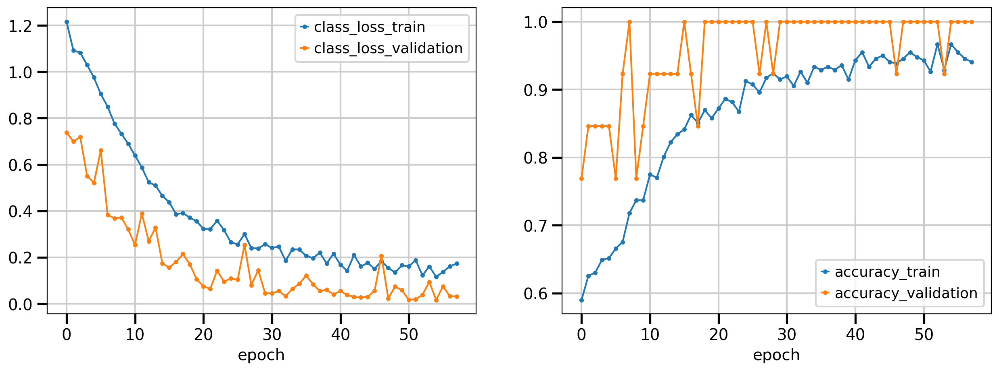

In [20]:
mil.plot_losses()

In [21]:
mil.get_model_output()
adata

AnnData object with n_obs × n_vars = 64679 × 16
    obs: 'sample_id', 'Neurotypical reference', 'Donor ID', 'Organism', 'Brain Region', 'Sex', 'Gender', 'Age at Death', 'Race (choice=White)', 'Race (choice=Black/ African American)', 'Race (choice=Asian)', 'Race (choice=American Indian/ Alaska Native)', 'Race (choice=Native Hawaiian or Pacific Islander)', 'Race (choice=Unknown or unreported)', 'Race (choice=Other)', 'specify other race', 'Hispanic/Latino', 'Highest level of education', 'Years of education', 'PMI', 'Fresh Brain Weight', 'Brain pH', 'Overall AD neuropathological Change', 'Thal', 'Braak', 'CERAD score', 'Overall CAA Score', 'Highest Lewy Body Disease', 'Total Microinfarcts (not observed grossly)', 'Total microinfarcts in screening sections', 'Atherosclerosis', 'Arteriolosclerosis', 'LATE', 'Cognitive Status', 'Last CASI Score', 'Interval from last CASI in months', 'Last MMSE Score', 'Interval from last MMSE in months', 'Last MOCA Score', 'Interval from last MOCA in months'

In [28]:
mtm.model.MILClassifier.setup_anndata(
    query,
    categorical_covariate_keys=categorical_covariate_keys,
)
new_model = mtm.model.MILClassifier.load_query_data(query, mil)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [29]:
new_model.get_model_output()

In [30]:
adata_both = ad.concat([adata, query])

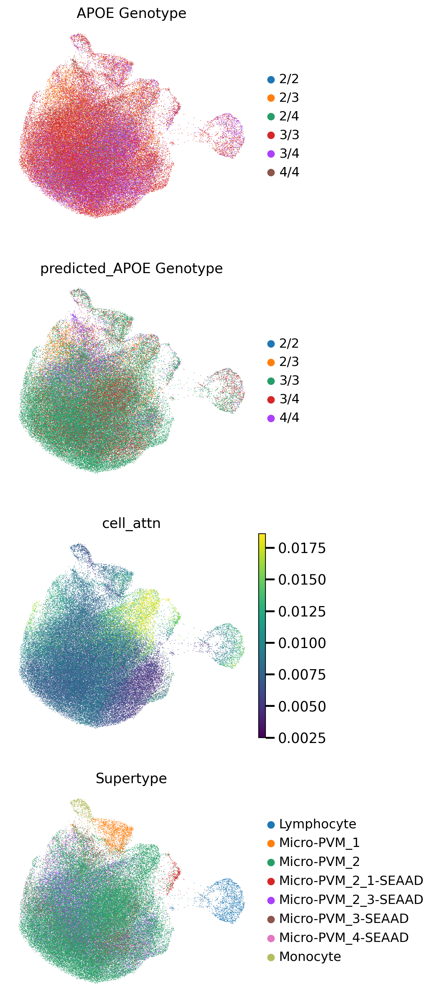

In [31]:
sc.pl.umap(adata_both, color=["APOE Genotype", "predicted_APOE Genotype", "cell_attn", 'Supertype'], ncols=1, frameon=False, vmax="p99")

In [43]:
adata_both.obs['high_attn'] = adata_both.obs['cell_attn']>0.0160

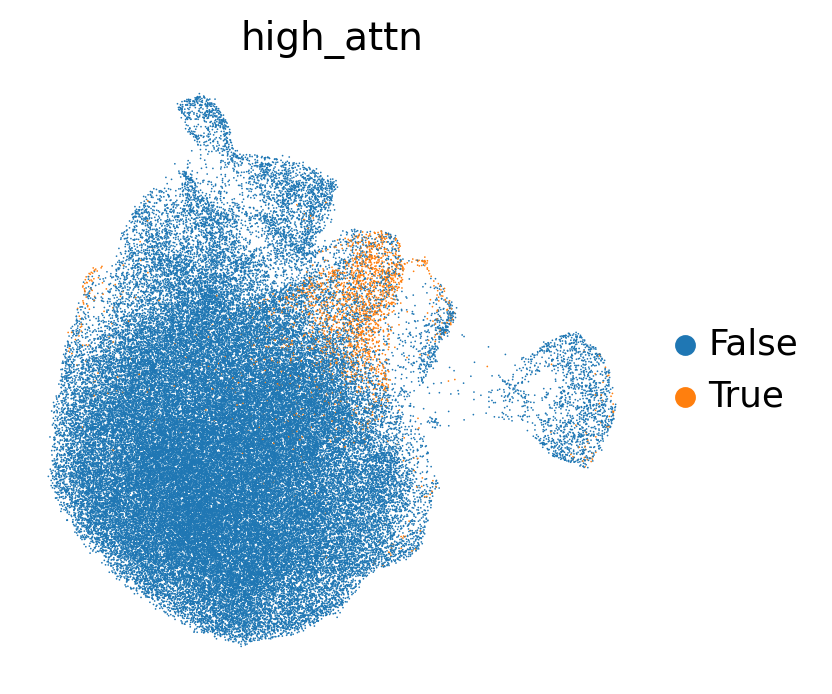

In [44]:
sc.pl.umap(adata_both, color=['high_attn'], frameon=False, vmax="p99", groups = ['True'])

In [50]:
adata_high_attn = adata_both[(adata_both.obs['high_attn']) & (adata_both.obs['Supertype']=='Micro-PVM_2')]

In [52]:
adata_high_attn.obs

,sample_id,Neurotypical reference,Donor ID,Organism,Brain Region,Sex,Gender,Age at Death,Race (choice=White),Race (choice=Black/ African American),...,percent.rp,seurat_clusters,State,size_factors,_scvi_batch,ref,cell_attn,bags,predicted_APOE Genotype,high_attn
ACATGCAGTAGGCAAC-L8TX_210318_01_B05-1153814162,ACATGCAGTAGGCAAC-L8TX_210318_01_B05-1153814162,False,H19.33.004,human,Human MTG,Female,Female,80.0,Checked,Unchecked,...,nan,nan,nan,1771.0,0,reference,0.016883,0,3/3,True
ACATCCCGTACAGAAT-L8TX_210430_01_G04-1153814211,ACATCCCGTACAGAAT-L8TX_210430_01_G04-1153814211,False,H19.33.004,human,Human MTG,Female,Female,80.0,Checked,Unchecked,...,nan,nan,nan,1345.0,0,reference,0.017302,0,3/3,True
GAACTGTCAGACACAG-L8TX_210617_01_C12-1113634358,GAACTGTCAGACACAG-L8TX_210617_01_C12-1113634358,False,H19.33.004,human,Human DFC_all_layers,Female,Female,80.0,Checked,Unchecked,...,nan,nan,nan,1038.0,0,reference,0.016980,0,3/3,True
ACCAAACTCACCATCC-L8TX_210430_01_G04-1153814211,ACCAAACTCACCATCC-L8TX_210430_01_G04-1153814211,False,H19.33.004,human,Human MTG,Female,Female,80.0,Checked,Unchecked,...,nan,nan,nan,1539.0,0,reference,0.016539,0,3/3,True
ACTATCTTCTAGACAC-L8TX_210430_01_G04-1153814211,ACTATCTTCTAGACAC-L8TX_210430_01_G04-1153814211,False,H19.33.004,human,Human MTG,Female,Female,80.0,Checked,Unchecked,...,nan,nan,nan,2083.0,0,reference,0.016193,0,3/3,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ACTTTCAAGGAAAGAC-L8TX_210909_01_F02-1129997619,ACTTTCAAGGAAAGAC-L8TX_210909_01_F02-1129997619,False,H21.33.037,human,Human DFC_all_layers,Female,Female,88.0,Checked,Unchecked,...,nan,nan,nan,404.0,0,query,0.020547,113,3/3,True
GACCGTGGTCTTGAGT-L8TX_210909_01_G01-1129994397,GACCGTGGTCTTGAGT-L8TX_210909_01_G01-1129994397,False,H21.33.037,human,Human DFC_all_layers,Female,Female,88.0,Checked,Unchecked,...,nan,nan,nan,983.0,0,query,0.019427,113,3/3,True
ATGGAGGTCAATCCGA-L8TX_210909_01_F02-1129997619,ATGGAGGTCAATCCGA-L8TX_210909_01_F02-1129997619,False,H21.33.037,human,Human DFC_all_layers,Female,Female,88.0,Checked,Unchecked,...,nan,nan,nan,766.0,0,query,0.017025,113,3/3,True
ACAAAGATCACTCCGT-L8TX_210909_01_G01-1129994397,ACAAAGATCACTCCGT-L8TX_210909_01_G01-1129994397,False,H21.33.037,human,Human DFC_all_layers,Female,Female,88.0,Checked,Unchecked,...,nan,nan,nan,319.0,0,query,0.017361,113,3/3,True


In [32]:
adata_both.obs[['Supertype', 'cell_attn']].groupby('Supertype').mean().sort_values(by = 'cell_attn')

/tmp/ipykernel_2533852/3178842693.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_both.obs[['Supertype', 'cell_attn']].groupby('Supertype').mean().sort_values(by = 'cell_attn')


,cell_attn
Supertype,
Monocyte,0.006663
Micro-PVM_2_3-SEAAD,0.007282
Micro-PVM_3-SEAAD,0.007580
Micro-PVM_2,0.007792
Micro-PVM_1,0.008377
Micro-PVM_4-SEAAD,0.009146
Lymphocyte,0.010428
Micro-PVM_2_1-SEAAD,0.011925


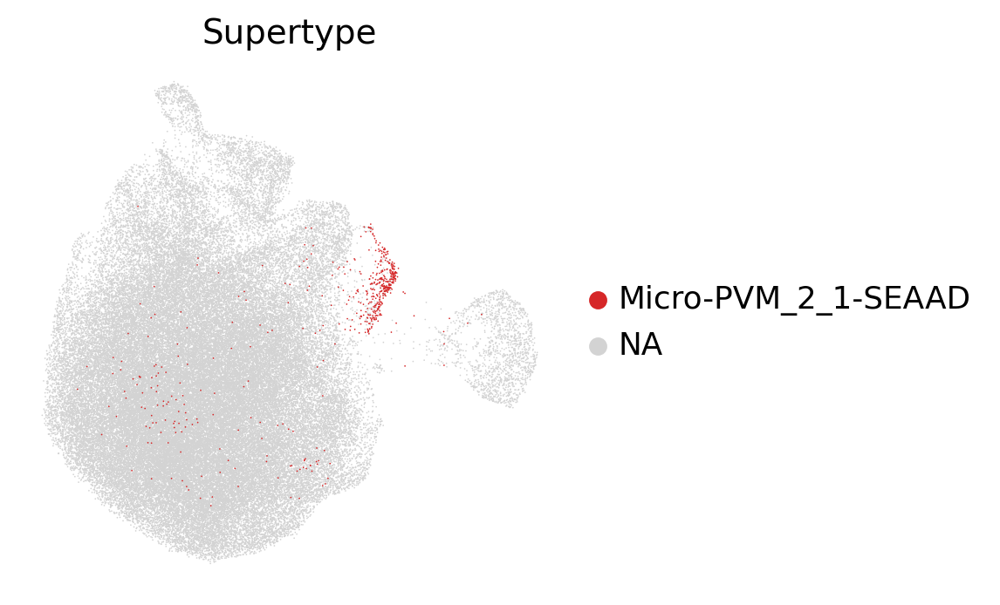

In [33]:
sc.pl.umap(adata_both, color='Supertype', ncols=1, frameon=False, vmax="p99", groups = ['Micro-PVM_2_1-SEAAD'])

In [35]:
from sklearn.metrics import classification_report

print(classification_report(query.obs["APOE Genotype"], query.obs["predicted_APOE Genotype"]))

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

              precision    recall  f1-score   support

         2/2       0.00      0.00      0.00         0
         2/3       0.30      0.11      0.16      1164
         2/4       0.00      0.00      0.00      1069
         3/3       0.51      0.66      0.57      6822
         3/4       0.69      0.53      0.60      5827
         4/4       0.00      0.00      0.00       531

    accuracy                           0.50     15413
   macro avg       0.25      0.22      0.22     15413
weighted avg       0.51      0.50      0.49     15413



/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [36]:
query.obs['Donor ID'].unique()

['H20.33.001', 'H20.33.004', 'H20.33.008', 'H20.33.018', 'H20.33.027', ..., 'H21.33.021', 'H21.33.025', 'H21.33.027', 'H21.33.037', 'H21.33.044']
Length: 16
Categories (16, object): ['H20.33.001', 'H20.33.004', 'H20.33.008', 'H20.33.018', ..., 'H21.33.025', 'H21.33.027', 'H21.33.037', 'H21.33.044']

### APOE only two class

In [179]:
classification_keys = ["APOE4"]
z_dim = 16
sample_key = 'Donor ID'
categorical_covariate_keys = classification_keys + [sample_key]

In [180]:
idx = adata.obs[sample_key].sort_values().index
adata = adata[idx].copy()

idx = query.obs[sample_key].sort_values().index
query = query[idx].copy()

In [181]:
adata.obs[['APOE4', 'APOE Genotype']]['APOE4'].value_counts()

APOE4
False    48981
True     15698
Name: count, dtype: int64

In [182]:
query.obs[['APOE4', 'APOE Genotype']]['APOE4'].value_counts()

APOE4
False    7986
True     7427
Name: count, dtype: int64

In [183]:
mtm.model.MILClassifier.setup_anndata(
    adata,
    categorical_covariate_keys=categorical_covariate_keys,
)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [184]:
mil = mtm.model.MILClassifier(
    adata,
    classification=classification_keys,
    z_dim=z_dim,
    sample_key=sample_key,
    class_loss_coef = 0.1,
    dropout = 0.05,
    n_layers_cell_aggregator = 16,
    n_layers_classifier = 4,
)

In [186]:
help(mtm.model.MILClassifier)

Help on class MILClassifier in module multimil.model._mil:

class MILClassifier(scvi.model.base._base_model.BaseModelClass, scvi.model.base._archesmixin.ArchesMixin)
 |  MILClassifier(adata, sample_key, classification=None, regression=None, ordinal_regression=None, sample_batch_size=128, normalization='layer', z_dim=16, dropout=0.2, scoring='gated_attn', attn_dim=16, n_layers_cell_aggregator: int = 1, n_layers_classifier: int = 2, n_layers_regressor: int = 2, n_layers_mlp_attn: int = 1, n_hidden_cell_aggregator: int = 128, n_hidden_classifier: int = 128, n_hidden_mlp_attn: int = 32, n_hidden_regressor: int = 128, class_loss_coef=1.0, regression_loss_coef=1.0, activation='leaky_relu', initialization=None, anneal_class_loss=False, ignore_covariates=None)
 |  
 |  MultiMIL MIL prediction model.
 |  
 |  Parameters
 |  ----------
 |  adata
 |      AnnData object containing embeddings and covariates.
 |  sample_key
 |      Key in `adata.obs` that corresponds to the sample covariate.
 |  cla

In [187]:
mil.train(lr=1e-5, train_size = 0.8, batch_size = 256, max_epochs = 400)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
/home/icb/zihe.zheng/miniconda3/envs/multimi

Epoch 2/400:   0%|                                               | 1/400 [00:02<18:00,  2.71s/it, loss=0.0734, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 3/400:   0%|▏                                              | 2/400 [00:05<17:42,  2.67s/it, loss=0.0485, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 4/400:   1%|▎                                              | 3/400 [00:08<17:30,  2.65s/it, loss=0.0699, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 5/400:   1%|▍                                              | 4/400 [00:10<17:24,  2.64s/it, loss=0.0517, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 6/400:   1%|▌                                              | 5/400 [00:13<17:26,  2.65s/it, loss=0.0733, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 7/400:   2%|▋                                              | 6/400 [00:15<17:29,  2.66s/it, loss=0.0426, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 8/400:   2%|▊                                              | 7/400 [00:18<17:31,  2.68s/it, loss=0.0674, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 9/400:   2%|▉                                              | 8/400 [00:21<17:25,  2.67s/it, loss=0.0602, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 10/400:   2%|█                                             | 9/400 [00:23<17:10,  2.63s/it, loss=0.0635, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 11/400:   2%|█▏                                           | 10/400 [00:26<17:00,  2.62s/it, loss=0.0564, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 12/400:   3%|█▏                                           | 11/400 [00:29<17:01,  2.63s/it, loss=0.0554, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 13/400:   3%|█▎                                           | 12/400 [00:31<17:13,  2.66s/it, loss=0.0652, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 14/400:   3%|█▍                                           | 13/400 [00:34<17:13,  2.67s/it, loss=0.0548, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 15/400:   4%|█▌                                           | 14/400 [00:37<17:05,  2.66s/it, loss=0.0617, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 16/400:   4%|█▋                                           | 15/400 [00:39<16:58,  2.65s/it, loss=0.0529, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 17/400:   4%|█▊                                           | 16/400 [00:42<17:24,  2.72s/it, loss=0.0645, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 18/400:   4%|█▉                                            | 17/400 [00:46<20:07,  3.15s/it, loss=0.056, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 19/400:   4%|██                                           | 18/400 [00:50<21:22,  3.36s/it, loss=0.0421, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 20/400:   5%|██▏                                          | 19/400 [00:54<21:38,  3.41s/it, loss=0.0599, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 21/400:   5%|██▎                                          | 20/400 [00:56<20:03,  3.17s/it, loss=0.0485, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 22/400:   5%|██▎                                          | 21/400 [00:59<18:57,  3.00s/it, loss=0.0325, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 23/400:   6%|██▍                                          | 22/400 [01:02<18:08,  2.88s/it, loss=0.0452, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 24/400:   6%|██▌                                          | 23/400 [01:04<17:36,  2.80s/it, loss=0.0454, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 25/400:   6%|██▋                                          | 24/400 [01:07<17:10,  2.74s/it, loss=0.0497, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 26/400:   6%|██▊                                          | 25/400 [01:09<16:54,  2.71s/it, loss=0.0573, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 27/400:   6%|██▉                                          | 26/400 [01:12<16:43,  2.68s/it, loss=0.0432, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 28/400:   7%|███                                          | 27/400 [01:15<16:34,  2.67s/it, loss=0.0595, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 29/400:   7%|███▏                                         | 28/400 [01:17<16:28,  2.66s/it, loss=0.0435, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 30/400:   7%|███▎                                         | 29/400 [01:20<16:21,  2.65s/it, loss=0.0464, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 31/400:   8%|███▍                                         | 30/400 [01:23<16:15,  2.64s/it, loss=0.0415, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 32/400:   8%|███▍                                         | 31/400 [01:25<16:12,  2.64s/it, loss=0.0565, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 33/400:   8%|███▋                                          | 32/400 [01:28<16:08,  2.63s/it, loss=0.044, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 34/400:   8%|███▋                                         | 33/400 [01:30<16:04,  2.63s/it, loss=0.0408, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 35/400:   8%|███▊                                         | 34/400 [01:33<16:01,  2.63s/it, loss=0.0349, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 36/400:   9%|███▉                                         | 35/400 [01:36<15:57,  2.62s/it, loss=0.0344, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 37/400:   9%|████                                         | 36/400 [01:39<16:23,  2.70s/it, loss=0.0381, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 38/400:   9%|████▏                                        | 37/400 [01:41<16:47,  2.78s/it, loss=0.0531, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 39/400:  10%|████▎                                        | 38/400 [01:44<16:41,  2.77s/it, loss=0.0304, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 40/400:  10%|████▍                                        | 39/400 [01:47<16:33,  2.75s/it, loss=0.0522, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 41/400:  10%|████▌                                        | 40/400 [01:50<16:27,  2.74s/it, loss=0.0447, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 42/400:  10%|████▌                                        | 41/400 [01:52<16:22,  2.74s/it, loss=0.0492, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 43/400:  10%|████▋                                        | 42/400 [01:55<16:17,  2.73s/it, loss=0.0454, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 44/400:  11%|████▊                                        | 43/400 [01:58<16:21,  2.75s/it, loss=0.0407, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 45/400:  11%|████▉                                        | 44/400 [02:01<16:16,  2.74s/it, loss=0.0334, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 46/400:  11%|█████                                        | 45/400 [02:03<16:12,  2.74s/it, loss=0.0511, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 47/400:  12%|█████▏                                       | 46/400 [02:06<16:09,  2.74s/it, loss=0.0374, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 48/400:  12%|█████▎                                       | 47/400 [02:09<16:05,  2.73s/it, loss=0.0481, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 49/400:  12%|█████▍                                       | 48/400 [02:12<16:00,  2.73s/it, loss=0.0426, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 50/400:  12%|█████▌                                       | 49/400 [02:14<15:54,  2.72s/it, loss=0.0455, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 51/400:  12%|█████▋                                       | 50/400 [02:17<15:50,  2.72s/it, loss=0.0476, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 52/400:  13%|█████▋                                       | 51/400 [02:20<15:48,  2.72s/it, loss=0.0532, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 53/400:  13%|█████▊                                       | 52/400 [02:22<15:45,  2.72s/it, loss=0.0337, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 54/400:  13%|█████▉                                       | 53/400 [02:25<15:42,  2.72s/it, loss=0.0565, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 55/400:  14%|██████                                       | 54/400 [02:28<15:40,  2.72s/it, loss=0.0375, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 56/400:  14%|██████▏                                      | 55/400 [02:31<15:36,  2.71s/it, loss=0.0391, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 57/400:  14%|██████▎                                      | 56/400 [02:33<15:34,  2.72s/it, loss=0.0444, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 58/400:  14%|██████▍                                      | 57/400 [02:36<15:34,  2.73s/it, loss=0.0422, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 59/400:  14%|██████▌                                      | 58/400 [02:39<15:33,  2.73s/it, loss=0.0367, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 60/400:  15%|██████▋                                      | 59/400 [02:41<15:31,  2.73s/it, loss=0.0512, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 61/400:  15%|██████▊                                      | 60/400 [02:44<15:30,  2.74s/it, loss=0.0408, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 62/400:  15%|██████▊                                      | 61/400 [02:47<15:34,  2.76s/it, loss=0.0227, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 63/400:  16%|██████▉                                      | 62/400 [02:50<15:26,  2.74s/it, loss=0.0413, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 64/400:  16%|███████                                      | 63/400 [02:52<15:21,  2.73s/it, loss=0.0394, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 65/400:  16%|███████▏                                     | 64/400 [02:55<15:22,  2.74s/it, loss=0.0478, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 66/400:  16%|███████▎                                     | 65/400 [02:58<15:16,  2.74s/it, loss=0.0411, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 67/400:  16%|███████▍                                     | 66/400 [03:01<15:11,  2.73s/it, loss=0.0541, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 68/400:  17%|███████▌                                     | 67/400 [03:03<15:07,  2.73s/it, loss=0.0435, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 69/400:  17%|███████▊                                      | 68/400 [03:06<15:08,  2.74s/it, loss=0.036, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 70/400:  17%|███████▊                                     | 69/400 [03:09<15:04,  2.73s/it, loss=0.0328, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 71/400:  18%|███████▊                                     | 70/400 [03:12<15:02,  2.73s/it, loss=0.0357, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 72/400:  18%|███████▉                                     | 71/400 [03:14<15:00,  2.74s/it, loss=0.0263, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 73/400:  18%|████████                                     | 72/400 [03:17<14:57,  2.74s/it, loss=0.0338, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 74/400:  18%|████████▏                                    | 73/400 [03:20<14:51,  2.73s/it, loss=0.0232, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 75/400:  18%|████████▎                                    | 74/400 [03:22<14:47,  2.72s/it, loss=0.0221, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 76/400:  19%|████████▍                                    | 75/400 [03:25<14:45,  2.72s/it, loss=0.0326, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 77/400:  19%|████████▋                                     | 76/400 [03:28<14:48,  2.74s/it, loss=0.033, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 78/400:  19%|████████▊                                     | 77/400 [03:31<14:47,  2.75s/it, loss=0.046, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 79/400:  20%|████████▊                                    | 78/400 [03:34<14:49,  2.76s/it, loss=0.0229, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 80/400:  20%|████████▉                                    | 79/400 [03:36<14:47,  2.76s/it, loss=0.0301, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 81/400:  20%|█████████                                    | 80/400 [03:39<14:44,  2.76s/it, loss=0.0384, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 82/400:  20%|█████████▎                                    | 81/400 [03:42<14:41,  2.76s/it, loss=0.035, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 83/400:  20%|█████████▏                                   | 82/400 [03:45<14:37,  2.76s/it, loss=0.0286, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 84/400:  21%|█████████▎                                   | 83/400 [03:47<14:31,  2.75s/it, loss=0.0279, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 85/400:  21%|█████████▍                                   | 84/400 [03:50<14:24,  2.73s/it, loss=0.0362, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 86/400:  21%|█████████▌                                   | 85/400 [03:53<14:19,  2.73s/it, loss=0.0339, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 87/400:  22%|█████████▋                                   | 86/400 [03:55<14:14,  2.72s/it, loss=0.0478, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 88/400:  22%|█████████▊                                   | 87/400 [03:58<14:10,  2.72s/it, loss=0.0284, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 89/400:  22%|██████████                                    | 88/400 [04:01<14:06,  2.71s/it, loss=0.021, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 90/400:  22%|██████████                                   | 89/400 [04:04<14:03,  2.71s/it, loss=0.0265, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 91/400:  22%|██████████▏                                  | 90/400 [04:06<14:03,  2.72s/it, loss=0.0145, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 92/400:  23%|██████████▏                                  | 91/400 [04:09<14:02,  2.73s/it, loss=0.0249, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 93/400:  23%|██████████▎                                  | 92/400 [04:12<13:58,  2.72s/it, loss=0.0265, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 94/400:  23%|██████████▍                                  | 93/400 [04:14<13:54,  2.72s/it, loss=0.0507, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 95/400:  24%|██████████▊                                   | 94/400 [04:17<13:51,  2.72s/it, loss=0.028, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 96/400:  24%|██████████▋                                  | 95/400 [04:20<13:48,  2.71s/it, loss=0.0127, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 97/400:  24%|██████████▊                                  | 96/400 [04:23<13:44,  2.71s/it, loss=0.0181, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 98/400:  24%|██████████▉                                  | 97/400 [04:25<13:40,  2.71s/it, loss=0.0377, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 99/400:  24%|███████████                                  | 98/400 [04:28<13:37,  2.71s/it, loss=0.0302, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 100/400:  25%|██████████▉                                 | 99/400 [04:31<13:32,  2.70s/it, loss=0.0235, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 101/400:  25%|██████████▊                                | 100/400 [04:33<13:28,  2.70s/it, loss=0.0286, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 102/400:  25%|██████████▊                                | 101/400 [04:36<13:26,  2.70s/it, loss=0.0154, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 103/400:  26%|██████████▉                                | 102/400 [04:39<13:23,  2.70s/it, loss=0.0197, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 104/400:  26%|███████████                                | 103/400 [04:41<13:24,  2.71s/it, loss=0.0224, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 105/400:  26%|███████████▏                               | 104/400 [04:44<13:31,  2.74s/it, loss=0.0428, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 106/400:  26%|███████████▎                               | 105/400 [04:47<13:24,  2.73s/it, loss=0.0286, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 107/400:  26%|███████████▍                               | 106/400 [04:50<13:19,  2.72s/it, loss=0.0213, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 108/400:  27%|███████████▌                               | 107/400 [04:52<13:15,  2.72s/it, loss=0.0289, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 109/400:  27%|███████████▌                               | 108/400 [04:56<14:19,  2.94s/it, loss=0.0332, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 110/400:  27%|███████████▉                                | 109/400 [04:59<15:13,  3.14s/it, loss=0.024, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 111/400:  28%|███████████▊                               | 110/400 [05:02<14:51,  3.08s/it, loss=0.0365, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 112/400:  28%|███████████▉                               | 111/400 [05:05<14:14,  2.96s/it, loss=0.0173, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 113/400:  28%|████████████▎                               | 112/400 [05:08<13:46,  2.87s/it, loss=0.014, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 114/400:  28%|████████████▏                              | 113/400 [05:10<13:25,  2.81s/it, loss=0.0252, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 115/400:  28%|████████████▎                              | 114/400 [05:13<13:10,  2.76s/it, loss=0.0117, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 116/400:  29%|████████████▎                              | 115/400 [05:16<12:59,  2.73s/it, loss=0.0277, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 117/400:  29%|████████████▍                              | 116/400 [05:18<12:52,  2.72s/it, loss=0.0296, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 118/400:  29%|████████████▌                              | 117/400 [05:21<12:47,  2.71s/it, loss=0.0375, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 119/400:  30%|████████████▋                              | 118/400 [05:24<12:43,  2.71s/it, loss=0.0246, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 120/400:  30%|████████████▊                              | 119/400 [05:26<12:39,  2.70s/it, loss=0.0218, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 121/400:  30%|████████████▉                              | 120/400 [05:29<12:37,  2.70s/it, loss=0.0233, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 122/400:  30%|█████████████▎                              | 121/400 [05:32<12:35,  2.71s/it, loss=0.014, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 123/400:  30%|█████████████▍                              | 122/400 [05:35<12:30,  2.70s/it, loss=0.015, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 124/400:  31%|█████████████▏                             | 123/400 [05:37<12:29,  2.70s/it, loss=0.0154, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 125/400:  31%|█████████████▎                             | 124/400 [05:40<12:23,  2.69s/it, loss=0.0244, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 126/400:  31%|█████████████▍                             | 125/400 [05:43<12:16,  2.68s/it, loss=0.0314, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 127/400:  32%|█████████████▌                             | 126/400 [05:45<12:14,  2.68s/it, loss=0.0274, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 128/400:  32%|█████████████▋                             | 127/400 [05:48<12:08,  2.67s/it, loss=0.0209, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 129/400:  32%|█████████████▊                             | 128/400 [05:51<12:05,  2.67s/it, loss=0.0151, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 130/400:  32%|█████████████▊                             | 129/400 [05:53<12:04,  2.67s/it, loss=0.0162, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 131/400:  32%|█████████████▉                             | 130/400 [05:56<12:04,  2.68s/it, loss=0.0284, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 132/400:  33%|██████████████                             | 131/400 [05:59<12:04,  2.69s/it, loss=0.0171, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 133/400:  33%|██████████████▌                             | 132/400 [06:01<12:05,  2.71s/it, loss=0.021, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 134/400:  33%|██████████████▎                            | 133/400 [06:04<12:03,  2.71s/it, loss=0.0164, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 135/400:  34%|██████████████▍                            | 134/400 [06:07<11:57,  2.70s/it, loss=0.0123, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 136/400:  34%|██████████████▌                            | 135/400 [06:10<11:51,  2.68s/it, loss=0.0214, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 137/400:  34%|██████████████▌                            | 136/400 [06:12<11:44,  2.67s/it, loss=0.0167, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 138/400:  34%|██████████████▋                            | 137/400 [06:15<11:52,  2.71s/it, loss=0.0188, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 139/400:  34%|██████████████▊                            | 138/400 [06:18<11:44,  2.69s/it, loss=0.0263, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 140/400:  35%|██████████████▉                            | 139/400 [06:20<11:36,  2.67s/it, loss=0.0123, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 141/400:  35%|███████████████                            | 140/400 [06:23<11:30,  2.66s/it, loss=0.0256, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 142/400:  35%|███████████████▏                           | 141/400 [06:25<11:23,  2.64s/it, loss=0.0242, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 143/400:  36%|██████████████▉                           | 142/400 [06:28<11:20,  2.64s/it, loss=0.00933, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 144/400:  36%|████████████████                             | 143/400 [06:31<11:17,  2.64s/it, loss=0.02, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 145/400:  36%|███████████████                           | 144/400 [06:33<11:14,  2.63s/it, loss=0.00575, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 146/400:  36%|███████████████▌                           | 145/400 [06:36<11:08,  2.62s/it, loss=0.0371, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 147/400:  36%|███████████████▋                           | 146/400 [06:39<11:07,  2.63s/it, loss=0.0379, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 148/400:  37%|███████████████▊                           | 147/400 [06:41<11:03,  2.62s/it, loss=0.0116, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 148/400:  37%|████████████████▎                           | 148/400 [06:44<11:28,  2.73s/it, loss=0.022, v_num=1]
Monitored metric accuracy_validation did not improve in the last 50 records. Best score: 0.938. Signaling Trainer to stop.


/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


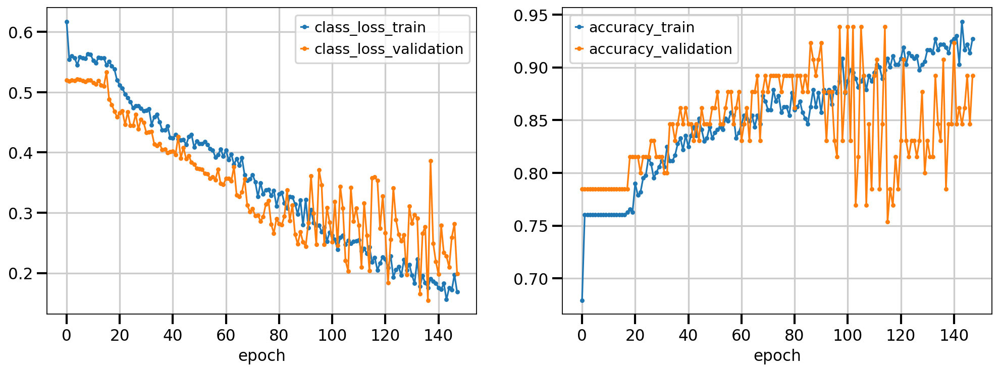

In [188]:
mil.plot_losses()

In [189]:
mil.get_model_output()

In [190]:
mtm.model.MILClassifier.setup_anndata(
    query,
    categorical_covariate_keys=categorical_covariate_keys,
)
new_model = mtm.model.MILClassifier.load_query_data(query, mil)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [191]:
new_model.get_model_output()

In [192]:
adata_both = ad.concat([adata, query])

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


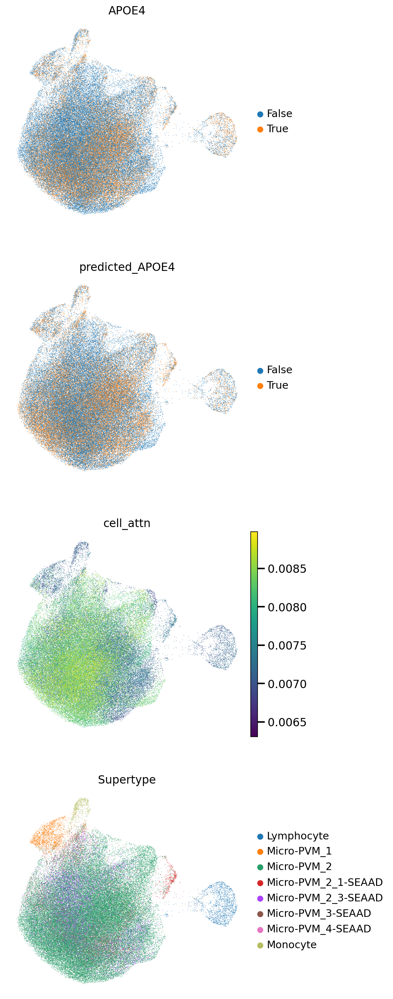

In [193]:
sc.set_figure_params(figsize = (5,5))
sc.pl.umap(adata_both, color=["APOE4", "predicted_APOE4", "cell_attn", 'Supertype'], ncols=1, frameon=False, vmax="p99")

In [194]:
from sklearn.metrics import classification_report

print(classification_report(query.obs["APOE4"], query.obs["predicted_APOE4"]))

              precision    recall  f1-score   support

       False       0.64      0.71      0.67      7986
        True       0.65      0.57      0.60      7427

    accuracy                           0.64     15413
   macro avg       0.64      0.64      0.64     15413
weighted avg       0.64      0.64      0.64     15413



/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


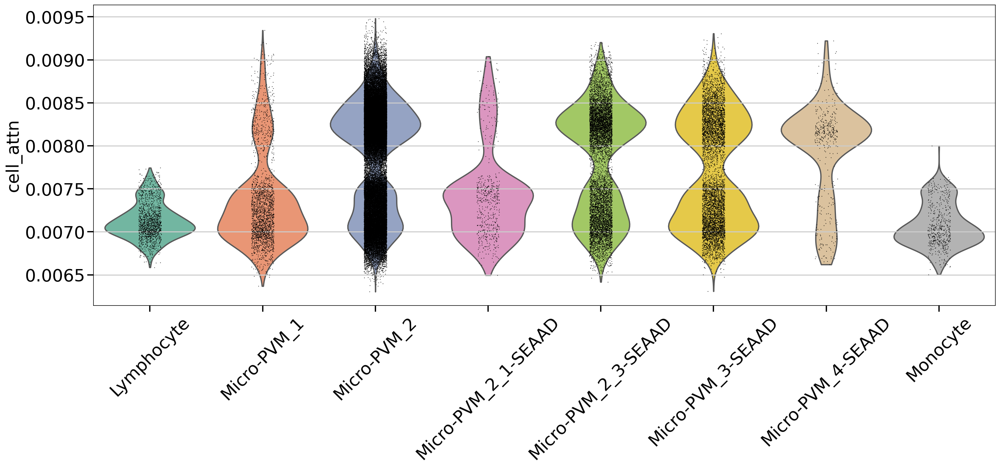

In [199]:
sc.set_figure_params(figsize = (18,8), fontsize = 25)
sc.pl.violin(adata_both, keys = 'cell_attn', palette='Set2', groupby = 'Supertype', rotation = 45)

### Braak

In [63]:
classification_keys = ["Braak"]
z_dim = 16
sample_key = 'Donor ID'
categorical_covariate_keys = classification_keys + [sample_key]

In [64]:
idx = adata.obs[sample_key].sort_values().index
adata = adata[idx].copy()

idx = query.obs[sample_key].sort_values().index
query = query[idx].copy()

In [65]:
mtm.model.MILClassifier.setup_anndata(
    adata,
    categorical_covariate_keys=categorical_covariate_keys,
)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [66]:
mil = mtm.model.MILClassifier(
    adata,
    classification=classification_keys,
    z_dim=z_dim,
    sample_key=sample_key,
    class_loss_coef=0.1,
)

In [67]:
mil.train(lr=1e-3)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
You are using a CUDA device ('NVIDIA A100-PC

Epoch 1/200:   0%|                                                                             | 0/200 [00:00<?, ?it/s]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 3/200:   1%|▍                                               | 2/200 [00:15<21:43,  6.58s/it, loss=0.126, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 4/200:   2%|▋                                               | 3/200 [00:16<14:35,  4.44s/it, loss=0.137, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 5/200:   2%|▉                                              | 4/200 [00:19<11:39,  3.57s/it, loss=0.0739, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 6/200:   2%|█▏                                              | 5/200 [00:20<08:51,  2.73s/it, loss=0.102, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 7/200:   3%|█▍                                             | 6/200 [00:21<07:07,  2.20s/it, loss=0.0832, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 8/200:   4%|█▋                                             | 7/200 [00:22<06:00,  1.87s/it, loss=0.0681, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 9/200:   4%|█▉                                             | 8/200 [00:23<05:16,  1.65s/it, loss=0.0671, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 10/200:   4%|██                                            | 9/200 [00:25<04:46,  1.50s/it, loss=0.0671, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 11/200:   5%|██▎                                          | 10/200 [00:26<05:01,  1.59s/it, loss=0.0584, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 12/200:   6%|██▌                                           | 11/200 [00:28<05:13,  1.66s/it, loss=0.049, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 13/200:   6%|██▋                                          | 12/200 [00:30<05:03,  1.61s/it, loss=0.0605, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 14/200:   6%|██▉                                          | 13/200 [00:31<04:37,  1.48s/it, loss=0.0591, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 15/200:   7%|███▏                                          | 14/200 [00:32<04:19,  1.40s/it, loss=0.035, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 16/200:   8%|███▍                                         | 15/200 [00:33<04:06,  1.33s/it, loss=0.0359, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 17/200:   8%|███▌                                         | 16/200 [00:34<03:56,  1.29s/it, loss=0.0593, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 18/200:   8%|███▊                                         | 17/200 [00:36<03:49,  1.26s/it, loss=0.0503, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 19/200:   9%|████                                         | 18/200 [00:37<03:44,  1.24s/it, loss=0.0239, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 20/200:  10%|████▎                                        | 19/200 [00:38<03:41,  1.22s/it, loss=0.0242, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 21/200:  10%|████▌                                        | 20/200 [00:39<03:38,  1.22s/it, loss=0.0406, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 22/200:  10%|████▋                                        | 21/200 [00:40<03:36,  1.21s/it, loss=0.0513, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 23/200:  11%|████▉                                        | 22/200 [00:42<03:34,  1.20s/it, loss=0.0465, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 24/200:  12%|█████▏                                       | 23/200 [00:43<03:32,  1.20s/it, loss=0.0474, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 25/200:  12%|█████▍                                       | 24/200 [00:44<03:31,  1.20s/it, loss=0.0331, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 26/200:  12%|█████▋                                       | 25/200 [00:45<03:29,  1.19s/it, loss=0.0209, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 27/200:  13%|██████                                         | 26/200 [00:46<03:27,  1.19s/it, loss=0.03, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 28/200:  14%|██████                                       | 27/200 [00:48<03:25,  1.19s/it, loss=0.0546, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 29/200:  14%|██████▎                                      | 28/200 [00:49<03:25,  1.19s/it, loss=0.0291, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 30/200:  14%|██████▌                                      | 29/200 [00:50<03:24,  1.20s/it, loss=0.0226, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 31/200:  15%|██████▉                                       | 30/200 [00:51<03:23,  1.20s/it, loss=0.031, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 32/200:  16%|██████▉                                      | 31/200 [00:52<03:22,  1.20s/it, loss=0.0287, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 33/200:  16%|███████▏                                     | 32/200 [00:54<03:21,  1.20s/it, loss=0.0219, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 34/200:  16%|███████▍                                     | 33/200 [00:55<03:20,  1.20s/it, loss=0.0363, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 35/200:  17%|███████▋                                     | 34/200 [00:56<03:21,  1.21s/it, loss=0.0302, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 36/200:  18%|███████▊                                     | 35/200 [00:57<03:20,  1.22s/it, loss=0.0338, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 37/200:  18%|████████                                     | 36/200 [00:59<03:20,  1.23s/it, loss=0.0284, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 38/200:  18%|████████▎                                    | 37/200 [01:00<03:18,  1.22s/it, loss=0.0165, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 39/200:  19%|████████▌                                    | 38/200 [01:01<03:16,  1.21s/it, loss=0.0304, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 40/200:  20%|████████▊                                    | 39/200 [01:02<03:14,  1.21s/it, loss=0.0172, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 41/200:  20%|█████████                                    | 40/200 [01:03<03:12,  1.20s/it, loss=0.0218, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 42/200:  20%|█████████▏                                   | 41/200 [01:04<03:10,  1.20s/it, loss=0.0297, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 43/200:  21%|█████████▍                                   | 42/200 [01:06<03:09,  1.20s/it, loss=0.0281, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 44/200:  22%|██████████                                     | 43/200 [01:07<03:08,  1.20s/it, loss=0.02, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 45/200:  22%|█████████▉                                   | 44/200 [01:08<03:06,  1.20s/it, loss=0.0268, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 46/200:  22%|██████████▎                                   | 45/200 [01:09<03:07,  1.21s/it, loss=0.036, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 47/200:  23%|██████████▎                                  | 46/200 [01:11<03:07,  1.21s/it, loss=0.0103, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 48/200:  24%|██████████▌                                  | 47/200 [01:12<03:04,  1.21s/it, loss=0.0181, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 49/200:  24%|██████████▊                                  | 48/200 [01:13<03:02,  1.20s/it, loss=0.0325, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 50/200:  24%|███████████                                  | 49/200 [01:14<03:00,  1.20s/it, loss=0.0202, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 51/200:  25%|███████████▎                                 | 50/200 [01:15<02:59,  1.20s/it, loss=0.0117, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 52/200:  26%|███████████▍                                 | 51/200 [01:16<02:57,  1.19s/it, loss=0.0331, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 53/200:  26%|███████████▋                                 | 52/200 [01:18<02:56,  1.19s/it, loss=0.0331, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 54/200:  26%|███████████▉                                 | 53/200 [01:19<02:55,  1.19s/it, loss=0.0155, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 55/200:  27%|████████████▏                                | 54/200 [01:20<02:54,  1.20s/it, loss=0.0112, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 56/200:  28%|████████████▍                                | 55/200 [01:21<02:54,  1.20s/it, loss=0.0156, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 57/200:  28%|████████████▎                               | 56/200 [01:22<02:52,  1.20s/it, loss=0.00989, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 58/200:  28%|████████████▊                                | 57/200 [01:24<02:50,  1.20s/it, loss=0.0169, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 59/200:  29%|█████████████                                | 58/200 [01:25<02:49,  1.19s/it, loss=0.0149, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 60/200:  30%|█████████████▎                               | 59/200 [01:26<02:48,  1.20s/it, loss=0.0171, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 61/200:  30%|█████████████▊                                | 60/200 [01:27<02:47,  1.19s/it, loss=0.023, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 62/200:  30%|█████████████▋                               | 61/200 [01:29<02:50,  1.23s/it, loss=0.0189, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 62/200:  31%|█████████████▉                               | 62/200 [01:30<03:22,  1.47s/it, loss=0.0107, v_num=1]
Monitored metric accuracy_validation did not improve in the last 50 records. Best score: 1.000. Signaling Trainer to stop.


/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


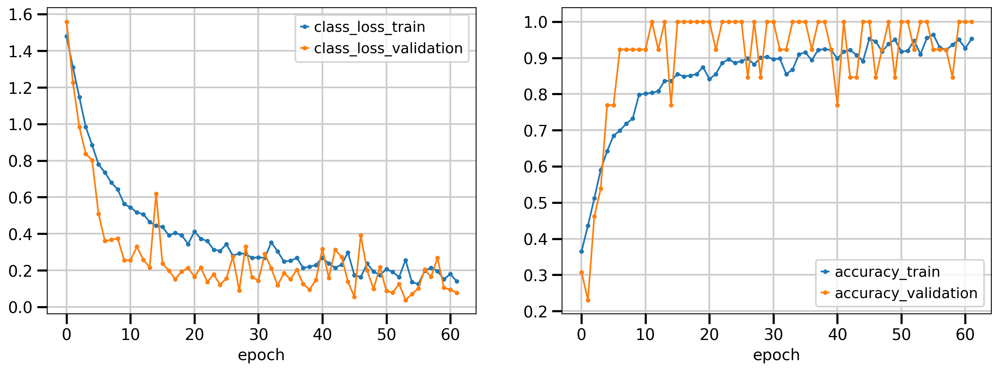

In [68]:
mil.plot_losses()

In [69]:
mil.get_model_output()

In [70]:
mtm.model.MILClassifier.setup_anndata(
    query,
    categorical_covariate_keys=categorical_covariate_keys,
)
new_model = mtm.model.MILClassifier.load_query_data(query, mil)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [71]:
new_model.get_model_output()

In [72]:
adata_both = ad.concat([adata, query])

In [78]:
print()

In [ ]:
sc.pl.umap(adata_both, color=['sample_id', 'Neurotypical reference', 'Donor ID', 'Organism', 'Brain Region', 'Sex', 'Gender', 'Age at Death', 'Race (choice=White)', 'Race (choice=Black/ African American)', 'Race (choice=Asian)', 'Race (choice=American Indian/ Alaska Native)', 'Race (choice=Native Hawaiian or Pacific Islander)', 'Race (choice=Unknown or unreported)', 'Race (choice=Other)', 'specify other race', 'Hispanic/Latino', 'Highest level of education', 'Years of education', 'PMI', 'Fresh Brain Weight', 'Brain pH', 'Overall AD neuropathological Change', 'Thal', 'Braak', 'CERAD score', 'Overall CAA Score', 'Highest Lewy Body Disease'], frameon=False, vmax="p99")

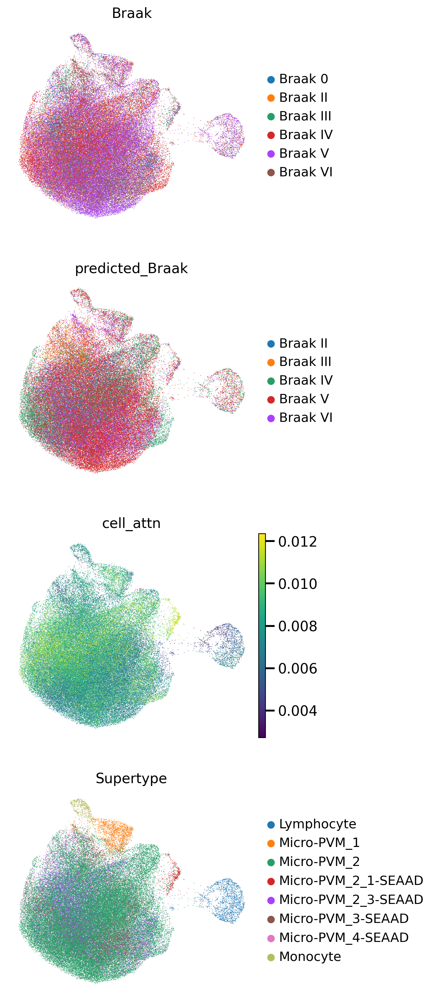

In [73]:
sc.pl.umap(adata_both, color=["Braak", "predicted_Braak", "cell_attn", 'Supertype'], ncols=1, frameon=False, vmax="p99")

In [74]:
adata_both.obs[['Supertype', 'cell_attn']].groupby('Supertype').mean().sort_values(by = 'cell_attn')

/tmp/ipykernel_2533852/3178842693.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_both.obs[['Supertype', 'cell_attn']].groupby('Supertype').mean().sort_values(by = 'cell_attn')


,cell_attn
Supertype,
Lymphocyte,0.005689
Micro-PVM_4-SEAAD,0.007079
Monocyte,0.007177
Micro-PVM_3-SEAAD,0.007359
Micro-PVM_2,0.007814
Micro-PVM_1,0.008145
Micro-PVM_2_3-SEAAD,0.008326
Micro-PVM_2_1-SEAAD,0.010276


In [76]:
from sklearn.metrics import classification_report

print(classification_report(query.obs["Braak"], query.obs["predicted_Braak"]))

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

     Braak 0       0.00      0.00      0.00      1273
   Braak III       0.00      0.00      0.00       570
    Braak IV       0.17      0.03      0.06      5322
     Braak V       0.33      0.53      0.41      5350
    Braak VI       0.29      0.45      0.35      2898

    accuracy                           0.28     15413
   macro avg       0.16      0.20      0.16     15413
weighted avg       0.23      0.28      0.23     15413



/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### Thal

In [15]:
classification_keys = ["Thal"]
z_dim = 16
sample_key = 'Donor ID'
categorical_covariate_keys = classification_keys + [sample_key]

In [16]:
idx = adata.obs[sample_key].sort_values().index
adata = adata[idx].copy()

idx = query.obs[sample_key].sort_values().index
query = query[idx].copy()

In [17]:
mtm.model.MILClassifier.setup_anndata(
    adata,
    categorical_covariate_keys=categorical_covariate_keys,
)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [18]:
mil = mtm.model.MILClassifier(
    adata,
    classification=classification_keys,
    z_dim=z_dim,
    sample_key=sample_key,
    class_loss_coef=0.1,
)

In [19]:
mil.train(lr=1e-4)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/zihe.zheng/miniconda3/envs/multimil/lib/py ...
  rank_zero_warn(
You are using a CUDA device ('NVIDIA A100-PC

Epoch 1/200:   0%|                                                                             | 0/200 [00:00<?, ?it/s]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 3/200:   1%|▍                                               | 2/200 [00:33<46:30, 14.09s/it, loss=0.175, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 4/200:   2%|▋                                               | 3/200 [00:35<28:25,  8.66s/it, loss=0.173, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 5/200:   2%|▉                                               | 4/200 [00:36<18:44,  5.74s/it, loss=0.162, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 6/200:   2%|█▏                                              | 5/200 [00:38<13:18,  4.10s/it, loss=0.162, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 7/200:   3%|█▍                                              | 6/200 [00:39<10:02,  3.11s/it, loss=0.149, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 8/200:   4%|█▋                                              | 7/200 [00:40<07:57,  2.47s/it, loss=0.149, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 9/200:   4%|█▉                                              | 8/200 [00:41<06:35,  2.06s/it, loss=0.155, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 10/200:   4%|██                                             | 9/200 [00:42<05:40,  1.79s/it, loss=0.133, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 11/200:   5%|██▎                                           | 10/200 [00:43<05:03,  1.60s/it, loss=0.147, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 12/200:   6%|██▌                                           | 11/200 [00:45<04:38,  1.47s/it, loss=0.144, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 13/200:   6%|██▊                                           | 12/200 [00:46<04:21,  1.39s/it, loss=0.133, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 14/200:   6%|███                                            | 13/200 [00:47<04:07,  1.32s/it, loss=0.15, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 15/200:   7%|███▏                                          | 14/200 [00:48<03:58,  1.28s/it, loss=0.144, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 16/200:   8%|███▍                                          | 15/200 [00:49<03:51,  1.25s/it, loss=0.125, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 17/200:   8%|███▋                                          | 16/200 [00:51<03:45,  1.23s/it, loss=0.142, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 18/200:   8%|███▉                                          | 17/200 [00:52<03:42,  1.22s/it, loss=0.126, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 19/200:   9%|████▏                                          | 18/200 [00:53<03:38,  1.20s/it, loss=0.13, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 20/200:  10%|████▎                                         | 19/200 [00:54<03:36,  1.19s/it, loss=0.118, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 21/200:  10%|████▌                                         | 20/200 [00:55<03:33,  1.19s/it, loss=0.109, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 22/200:  10%|████▊                                         | 21/200 [00:56<03:31,  1.18s/it, loss=0.123, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 23/200:  11%|█████                                         | 22/200 [00:58<03:29,  1.18s/it, loss=0.131, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 24/200:  12%|█████▎                                        | 23/200 [00:59<03:28,  1.18s/it, loss=0.107, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 25/200:  12%|█████▌                                        | 24/200 [01:00<03:26,  1.17s/it, loss=0.103, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 26/200:  12%|█████▊                                        | 25/200 [01:01<03:25,  1.17s/it, loss=0.105, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 27/200:  13%|█████▊                                       | 26/200 [01:02<03:23,  1.17s/it, loss=0.0996, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 28/200:  14%|██████▏                                       | 27/200 [01:03<03:23,  1.17s/it, loss=0.127, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 29/200:  14%|██████▌                                        | 28/200 [01:05<03:53,  1.36s/it, loss=0.13, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 30/200:  14%|██████▋                                       | 29/200 [01:07<04:14,  1.49s/it, loss=0.104, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 31/200:  15%|██████▊                                      | 30/200 [01:09<04:14,  1.50s/it, loss=0.0979, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 32/200:  16%|██████▉                                      | 31/200 [01:10<03:57,  1.40s/it, loss=0.0955, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 33/200:  16%|███████▏                                     | 32/200 [01:11<03:45,  1.34s/it, loss=0.0893, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 34/200:  16%|███████▍                                     | 33/200 [01:12<03:35,  1.29s/it, loss=0.0725, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 35/200:  17%|███████▋                                     | 34/200 [01:13<03:29,  1.26s/it, loss=0.0878, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 36/200:  18%|███████▊                                     | 35/200 [01:14<03:24,  1.24s/it, loss=0.0845, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 37/200:  18%|████████                                     | 36/200 [01:16<03:20,  1.22s/it, loss=0.0786, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 38/200:  18%|████████▌                                     | 37/200 [01:17<03:41,  1.36s/it, loss=0.089, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 39/200:  19%|████████▌                                    | 38/200 [01:19<04:02,  1.50s/it, loss=0.0748, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 40/200:  20%|████████▊                                    | 39/200 [01:21<04:05,  1.52s/it, loss=0.0769, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 41/200:  20%|█████████                                    | 40/200 [01:22<03:49,  1.43s/it, loss=0.0616, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 42/200:  20%|█████████▏                                   | 41/200 [01:23<03:37,  1.37s/it, loss=0.0585, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 43/200:  21%|█████████▍                                   | 42/200 [01:24<03:28,  1.32s/it, loss=0.0736, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 44/200:  22%|█████████▉                                    | 43/200 [01:26<03:21,  1.28s/it, loss=0.064, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 45/200:  22%|█████████▉                                   | 44/200 [01:27<03:16,  1.26s/it, loss=0.0628, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 46/200:  22%|██████████▏                                  | 45/200 [01:28<03:12,  1.24s/it, loss=0.0778, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 47/200:  23%|██████████▎                                  | 46/200 [01:29<03:09,  1.23s/it, loss=0.0746, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 48/200:  24%|██████████▌                                  | 47/200 [01:30<03:06,  1.22s/it, loss=0.0659, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 49/200:  24%|██████████▊                                  | 48/200 [01:32<03:05,  1.22s/it, loss=0.0664, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 50/200:  24%|███████████                                  | 49/200 [01:33<03:03,  1.21s/it, loss=0.0637, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 51/200:  25%|███████████▌                                  | 50/200 [01:34<03:03,  1.22s/it, loss=0.065, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 52/200:  26%|███████████▍                                 | 51/200 [01:35<03:01,  1.21s/it, loss=0.0818, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 53/200:  26%|███████████▋                                 | 52/200 [01:36<02:59,  1.21s/it, loss=0.0566, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 54/200:  26%|███████████▉                                 | 53/200 [01:38<02:57,  1.21s/it, loss=0.0653, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 55/200:  27%|████████████▏                                | 54/200 [01:39<02:57,  1.21s/it, loss=0.0593, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 56/200:  28%|████████████▍                                | 55/200 [01:40<03:00,  1.24s/it, loss=0.0682, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 57/200:  28%|████████████▌                                | 56/200 [01:43<03:46,  1.57s/it, loss=0.0782, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 58/200:  28%|████████████▊                                | 57/200 [01:44<03:50,  1.61s/it, loss=0.0372, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 59/200:  29%|█████████████                                | 58/200 [01:45<03:31,  1.49s/it, loss=0.0655, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 60/200:  30%|█████████████▎                               | 59/200 [01:47<03:17,  1.40s/it, loss=0.0486, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 61/200:  30%|█████████████▌                               | 60/200 [01:48<03:07,  1.34s/it, loss=0.0545, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 62/200:  30%|██████████████                                | 61/200 [01:49<02:59,  1.29s/it, loss=0.076, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 63/200:  31%|█████████████▉                               | 62/200 [01:50<02:53,  1.26s/it, loss=0.0591, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 64/200:  32%|██████████████▏                              | 63/200 [01:51<02:49,  1.24s/it, loss=0.0799, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 65/200:  32%|██████████████▍                              | 64/200 [01:53<02:45,  1.22s/it, loss=0.0504, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 66/200:  32%|██████████████▋                              | 65/200 [01:54<02:43,  1.21s/it, loss=0.0567, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 67/200:  33%|██████████████▊                              | 66/200 [01:55<02:42,  1.21s/it, loss=0.0583, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 68/200:  34%|███████████████                              | 67/200 [01:56<02:39,  1.20s/it, loss=0.0417, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 69/200:  34%|███████████████▎                             | 68/200 [01:57<02:37,  1.20s/it, loss=0.0558, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 70/200:  34%|███████████████▌                             | 69/200 [01:58<02:35,  1.19s/it, loss=0.0508, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 71/200:  35%|███████████████▋                             | 70/200 [02:00<02:34,  1.19s/it, loss=0.0454, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 72/200:  36%|███████████████▉                             | 71/200 [02:01<02:32,  1.18s/it, loss=0.0416, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 73/200:  36%|████████████████▏                            | 72/200 [02:02<02:31,  1.18s/it, loss=0.0625, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 74/200:  36%|████████████████▍                            | 73/200 [02:03<02:30,  1.18s/it, loss=0.0549, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 75/200:  37%|████████████████▋                            | 74/200 [02:04<02:29,  1.18s/it, loss=0.0538, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 76/200:  38%|████████████████▉                            | 75/200 [02:06<02:30,  1.20s/it, loss=0.0578, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 77/200:  38%|█████████████████                            | 76/200 [02:07<02:41,  1.30s/it, loss=0.0516, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 78/200:  38%|█████████████████▎                           | 77/200 [02:09<02:59,  1.46s/it, loss=0.0434, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 79/200:  39%|█████████████████▌                           | 78/200 [02:11<03:10,  1.56s/it, loss=0.0521, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 80/200:  40%|█████████████████▊                           | 79/200 [02:12<03:04,  1.52s/it, loss=0.0421, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 81/200:  40%|██████████████████                           | 80/200 [02:13<02:51,  1.43s/it, loss=0.0374, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 82/200:  40%|██████████████████▏                          | 81/200 [02:15<02:41,  1.36s/it, loss=0.0491, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 83/200:  41%|██████████████████▍                          | 82/200 [02:16<02:34,  1.31s/it, loss=0.0461, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 84/200:  42%|██████████████████▋                          | 83/200 [02:17<02:29,  1.28s/it, loss=0.0553, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 85/200:  42%|██████████████████▉                          | 84/200 [02:18<02:25,  1.26s/it, loss=0.0461, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 86/200:  42%|███████████████████▏                         | 85/200 [02:19<02:22,  1.24s/it, loss=0.0354, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 87/200:  43%|███████████████████▎                         | 86/200 [02:21<02:21,  1.24s/it, loss=0.0403, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 88/200:  44%|███████████████████▌                         | 87/200 [02:22<02:19,  1.23s/it, loss=0.0436, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 89/200:  44%|███████████████████▊                         | 88/200 [02:23<02:16,  1.22s/it, loss=0.0417, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 90/200:  44%|████████████████████                         | 89/200 [02:24<02:15,  1.22s/it, loss=0.0419, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 91/200:  45%|████████████████████▎                        | 90/200 [02:26<02:13,  1.21s/it, loss=0.0461, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 92/200:  46%|████████████████████▍                        | 91/200 [02:27<02:12,  1.21s/it, loss=0.0493, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 93/200:  46%|████████████████████▋                        | 92/200 [02:28<02:10,  1.21s/it, loss=0.0469, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 94/200:  46%|████████████████████▉                        | 93/200 [02:29<02:09,  1.21s/it, loss=0.0419, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 95/200:  47%|█████████████████████▏                       | 94/200 [02:30<02:07,  1.21s/it, loss=0.0376, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 96/200:  48%|█████████████████████▍                       | 95/200 [02:32<02:06,  1.20s/it, loss=0.0302, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 97/200:  48%|█████████████████████▌                       | 96/200 [02:33<02:16,  1.31s/it, loss=0.0334, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 98/200:  48%|█████████████████████▊                       | 97/200 [02:35<02:31,  1.47s/it, loss=0.0476, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 98/200:  49%|██████████████████████                       | 98/200 [02:37<02:41,  1.59s/it, loss=0.0428, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 100/200:  50%|██████████████████████▊                       | 99/200 [02:39<02:49,  1.68s/it, loss=0.04, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 101/200:  50%|█████████████████████▌                     | 100/200 [02:41<02:51,  1.72s/it, loss=0.0272, v_num=1]

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


Epoch 101/200:  50%|█████████████████████▋                     | 101/200 [02:42<02:39,  1.61s/it, loss=0.0239, v_num=1]
Monitored metric accuracy_validation did not improve in the last 50 records. Best score: 1.000. Signaling Trainer to stop.


/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:32: DeprecationWarning: This property will be removed in 2.0.0. Use `Metric.updated_called` instead.
  return fn(*args, **kwargs)


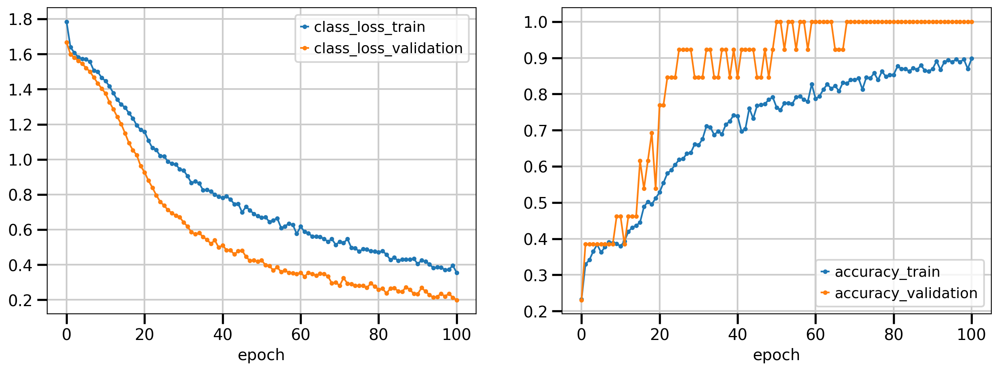

In [20]:
mil.plot_losses()

In [21]:
mil.get_model_output()

In [22]:
mtm.model.MILClassifier.setup_anndata(
    query,
    categorical_covariate_keys=categorical_covariate_keys,
)
new_model = mtm.model.MILClassifier.load_query_data(query, mil)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:90: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [23]:
new_model.get_model_output()

In [24]:
adata_both = ad.concat([adata, query])

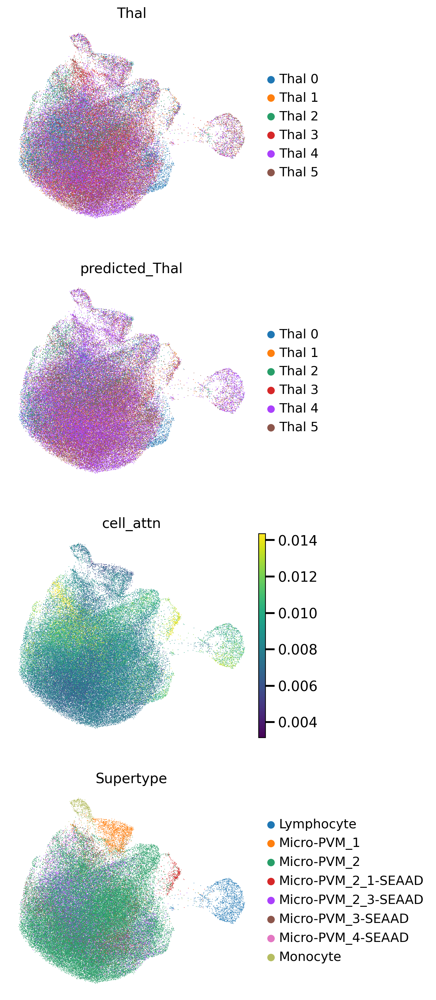

In [25]:
sc.pl.umap(adata_both, color=["Thal", "predicted_Thal", "cell_attn", 'Supertype'], ncols=1, frameon=False, vmax="p99")

In [26]:
from sklearn.metrics import classification_report

print(classification_report(query.obs["Thal"], query.obs["predicted_Thal"]))

              precision    recall  f1-score   support

      Thal 0       0.00      0.00      0.00      1273
      Thal 1       0.00      0.00      0.00         0
      Thal 2       0.00      0.00      0.00      1798
      Thal 3       0.00      0.00      0.00      3946
      Thal 4       0.34      0.68      0.45      3737
      Thal 5       0.27      0.43      0.33      4659

    accuracy                           0.30     15413
   macro avg       0.10      0.19      0.13     15413
weighted avg       0.16      0.30      0.21     15413



/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:907: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


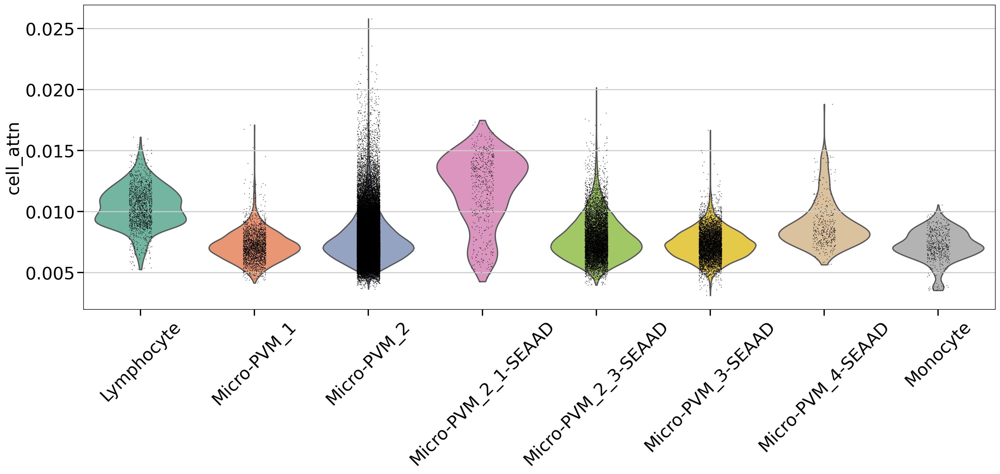

In [27]:
sc.set_figure_params(figsize = (18,8), fontsize = 25)
sc.pl.violin(adata_both, keys = 'cell_attn', palette='Set2', groupby = 'Supertype', rotation = 45)

#### prediction of Thal on sun data

In [28]:
adata_int = sc.read_h5ad('/home/icb/zihe.zheng/projects/microglia/data/integrated_all_5000atac_no_single_atac.h5ad')

In [29]:
# Ensure both categorical columns have the same categories
combined_categories = adata_int.obs['Donor ID'].cat.categories.union(adata.obs['subject'].cat.categories)

# Set the combined categories for both columns
adata_int.obs['Donor ID'] = adata_int.obs['Donor ID'].cat.set_categories(combined_categories)
adata_int.obs['subject'] = adata_int.obs['subject'].cat.set_categories(combined_categories)

# Fill NaN values in 'Brain Region' with values from 'brainRegion'
# adata.obs['Donor ID'] = adata.obs['Donor ID'].replace('nan', np.nan)  # Ensure real NaN values
# adata.obs['Donor ID'] = adata.obs['Donor ID'].fillna(adata.obs['subject'])
adata_int.obs['Donor ID'] = adata_int.obs['Donor ID'].mask(adata_int.obs['Donor ID'] == 'nan', adata_int.obs['subject'])


In [30]:
adata_int.obs['Donor ID']

AAACAGCCAACAACAA-L8XR_210902_02_B08-1131257169    H20.33.004
AAACAGCCATAGCAGG-L8XR_210916_02_B11-1131607954    H21.33.003
AAACCAACAATAGCCC-L8XR_210805_01_E10-1124629229    H20.33.008
AAACCAACATGGAGGC-L8XR_210729_01_D09-1124629224    H20.33.017
AAACCGAAGGAACGCG-L8XR_210805_01_H09-1124629228    H20.33.025
                                                     ...    
Thalamus.TCATGCCGTCTGCATA-46                             NaN
Thalamus.TCTAACTCAAAGGGTC-46                             NaN
Thalamus.CAGATCAAGCAACTCT-47                             NaN
Thalamus.GTAGAGGAGGCTGGAT-47                             NaN
Thalamus.TTCGATTGTATGTCTG-47                             NaN
Name: Donor ID, Length: 234945, dtype: category
Categories (90, object): ['H18.30.001', 'H18.30.002', 'H19.30.001', 'H19.30.002', ..., 'H21.33.045', 'H21.33.046', 'H21.33.047', 'nan']

In [145]:
adata_sun = adata_int[adata_int.obs['seurat_clusters']!='nan'].copy()

In [148]:
adata_sun.obs['Donor ID']

SM_171013Tsa.AACTTTCAGGATGGTC-1    NaN
SM_171013Tsa.ACGGGCTCAATCAGAA-1    NaN
SM_171013Tsa.AGCGGTCAGATGTTAG-1    NaN
SM_171013Tsa.ATTACTCAGGAGTAGA-1    NaN
SM_171013Tsa.CAACCAACAAGCGTAG-1    NaN
                                  ... 
Thalamus.TCATGCCGTCTGCATA-46       NaN
Thalamus.TCTAACTCAAAGGGTC-46       NaN
Thalamus.CAGATCAAGCAACTCT-47       NaN
Thalamus.GTAGAGGAGGCTGGAT-47       NaN
Thalamus.TTCGATTGTATGTCTG-47       NaN
Name: Donor ID, Length: 152459, dtype: category
Categories (0, object): []

In [146]:
mtm.model.MILClassifier.setup_anndata(
    adata_sun,
    categorical_covariate_keys=["Thal", 'Donor ID'],
)
new_model = mtm.model.MILClassifier.load_query_data(adata_sun, mil)

/home/icb/zihe.zheng/miniconda3/envs/multimil/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


ValueError: Making .obs["Donor ID"] categorical failed. Expected categories: []. Received categories: Index([], dtype='object'). 